# Introduction To Rusty Axe

This notebook will give you a guided tour through using Rusty Axe.

We'll use the iris toy dataset for simplicity and speed, but if you have a dataset you wish to analyize, you should feel free to copy this notebook and swap out the iris matrix for a matrix or an input/output pair of your choice!

Brief note about system requirements: the advantage of Random Forest Regressors is that they can run fairly efficiently by down-sampling large datasets during bootstrapping. You will need enough memory to fully load your dataset, but once it is loaded, the memory requirement per extra thread will depend on your bootstrapping settings. If you are running this on a laptop or personal machine, feel free to do a test run with the setting p=1. This will restrict the RF to a single thread and allow you to monitor memory usage. 

## Loading The Data

In [1]:

import numpy as np
import matplotlib.pyplot as plt
# import scanpy as sc

import pickle 

data_location = "./iris/"

iris = np.loadtxt(data_location + "iris.tsv")
iris_features = np.loadtxt(data_location + "iris.features",dtype=str)

Firstly we will need to train a random forest regressor describing our data. We recommend starting with the built-in RFR because it has better support for unsupervised forests, but support for sk-learn based forests is also available. 

We need to describe several important settings here.

In [2]:
from rusty_axe import lumberjack

forest = lumberjack.fit(
    iris, 
    # Input: n by m numpy array. Rows should be samples, columns should be features (eg genes or measurements)
    # If only one array is provided, Rusty Axe defaults to unsupervised mode, where features with the same name 
    # cannot be in both the input and the output.

    header=iris_features,
    # Header of feature names. This will be enormously helpful for interpretation, so we recommend providing it here.

    trees=500,
    # Numer of trees to train. For multi-output forests such as scRNAseq data, the number of unique trees is 
    # generally less important than the depth, so try it with 100 first. 
    # See saturation analysis tutorial for more information. 
    
    input_feature_subsample=2,
    # Input feature subsampling rate, eg how many features can potentially be split on at each bootstrap. 
    # Rule of thumb: use 1/2 to 1/3 of all features. (eg if you are observing 2000 variable genes, say 700 here)
    
    output_feature_subsample=2,
    # Output feature subsampling rate, eg how many features are evaluated for improvement in dispersion at each 
    # bootstrap. Apply similar rule of thumb as to inputs. 
    
    ss=50,
    # Sample subsampling rate. Number of samples evaluated at each bootstrap. This parameter depends on how 
    # "grainy" your data is. If you are looking for small, rare clusters first, the rule of thumb should be
    # to use higher values (500-1000).
    # Conversely, if you are looking big, obvious clusters first, leave this value small (150-300)
    
    
    depth=3,
    # Maximum depth of each tree. 
    # This value determines the complexity of the factors you will obtain. 
    # If your data isn't very complicated leave this value low (~5-6)
    # If your data has a lot of complexity and heterogeneity, set this value higher (8-10)

    
    sfr=0,
    norm='l1',
    dispersion_mode = "ssme",
    standardize = "true",
    # These are helpful defaults for the optimization metric to use. For more details please refer to the 
    # optimization metric tutorial. 
    

    reduce_input='false',
    reduce_output='false',
    # These parameters dictate whether or not dimensional reduction is applied at each node split. 
    # For sparse data such as scRNAseq this can be enormously helpful in making more highly interpretable trees
    # On the other hand if your data is poorly behaved under dimensional reduction, this setting can be left off. 
    
    cache = True
    # This setting is true by default, but please keep it in mind if you need to train a very large
    # forest, or one with a huge number of features. 
    # This setting prevents Python from caching a variety of values within individual nodes, potentially saving
    # much space in memory, but it slows down all computations considerably. 

    # Set this to false when you wish to train a very large forest and then immediately filter it to a smaller
    # forest based on some criterion. 
)

Setting context
Input:(150, 4)
Output:(150, 4)
Generating trees
Running /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/bin/rf_5
Command: /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/bin/rf_5 -ic /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/input.counts -oc /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/output.counts -o /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp -auto -ifh /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.ifh -ofh /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.ofh -trees 500 -input_feature_subsample 2 -output_feature_subsample 2 -ss 50 -depth 3 -sfr 0 -norm l1 -dispersion_mode ssme -standardize true -reduce_input false -reduce_output false
Read parameters

5.1 0
100
150,4

5.1 0
100
150,4
Reading header: /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.ifh
Read 4 lines
Reading header: /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/

Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_354.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_355.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_356.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_357.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_358.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_359.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_36.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_360.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_361.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_362.compact
Loading /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpp8lbklbo/tmp.tree_363.compact
Loading /va

In [3]:
forest.backup("./iris_forest")
# Forests aren't determsinistic in nature, so if you wish to continue an analysis that you started, 
# don't depend on repeating the same calculations and getting an exactly identical answer. For convenience 
# we instead provide this method of saving a forest so that you can reload it later. 
# Most computations should be cached in the saved forest, but save after each computation you wish to cache!

Saving forest
./iris_forest


## Analyzing Nodes 

In [4]:
len(forest.nodes())


7104

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


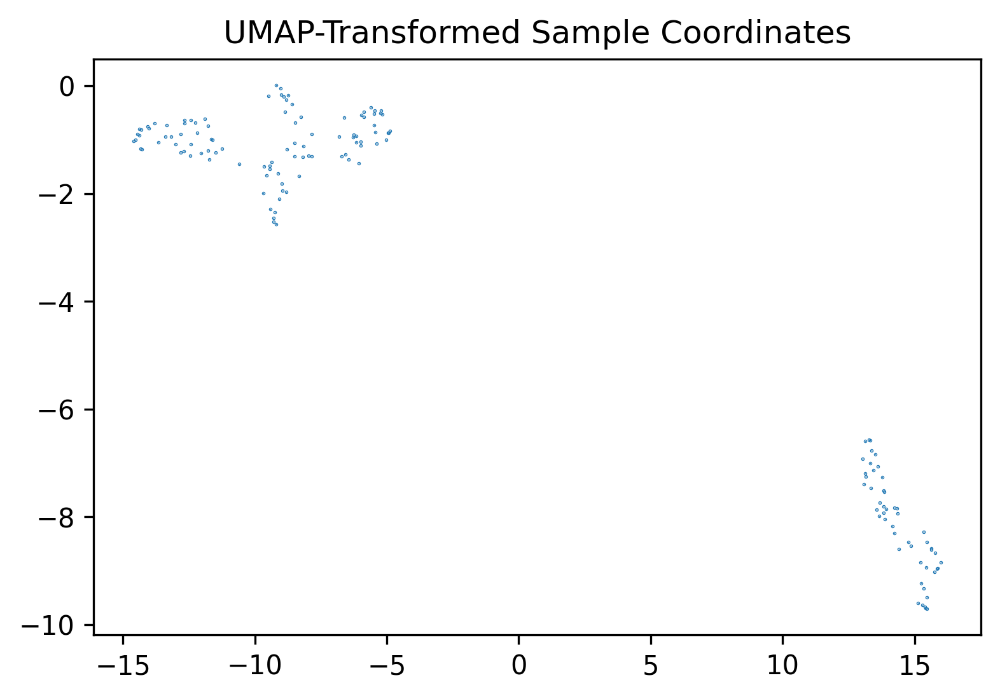

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


array([[ 1.3076249 , -1.3083576 ],
       [ 1.4436224 , -1.8155664 ],
       [ 1.4860827 , -1.5182017 ],
       [ 1.4711097 , -1.6212848 ],
       [ 1.3164618 , -1.3433572 ],
       [ 1.2860286 , -1.0544752 ],
       [ 1.4732946 , -1.4832716 ],
       [ 1.3586116 , -1.3974047 ],
       [ 1.5065335 , -1.6295893 ],
       [ 1.4572412 , -1.8269832 ],
       [ 1.3103864 , -1.0713847 ],
       [ 1.4119279 , -1.4841994 ],
       [ 1.4728187 , -1.7845044 ],
       [ 1.5175494 , -1.5963417 ],
       [ 1.285846  , -0.9317419 ],
       [ 1.2697492 , -0.93538845],
       [ 1.2912366 , -0.98492706],
       [ 1.3389095 , -1.3031498 ],
       [ 1.3025353 , -1.0082778 ],
       [ 1.2645669 , -1.1695038 ],
       [ 1.3330535 , -1.2101552 ],
       [ 1.2878325 , -1.1919006 ],
       [ 1.4625509 , -1.428358  ],
       [ 1.373602  , -1.2999601 ],
       [ 1.4204894 , -1.5047219 ],
       [ 1.4669017 , -1.8379176 ],
       [ 1.376512  , -1.3284245 ],
       [ 1.3182548 , -1.2701992 ],
       [ 1.329203  ,

In [5]:
# Firstly we can visualize an embedding of our data using TSNE or UMAP to get a feel for the distribution of 
# the underlying values

forest.coordinates(type='umap')

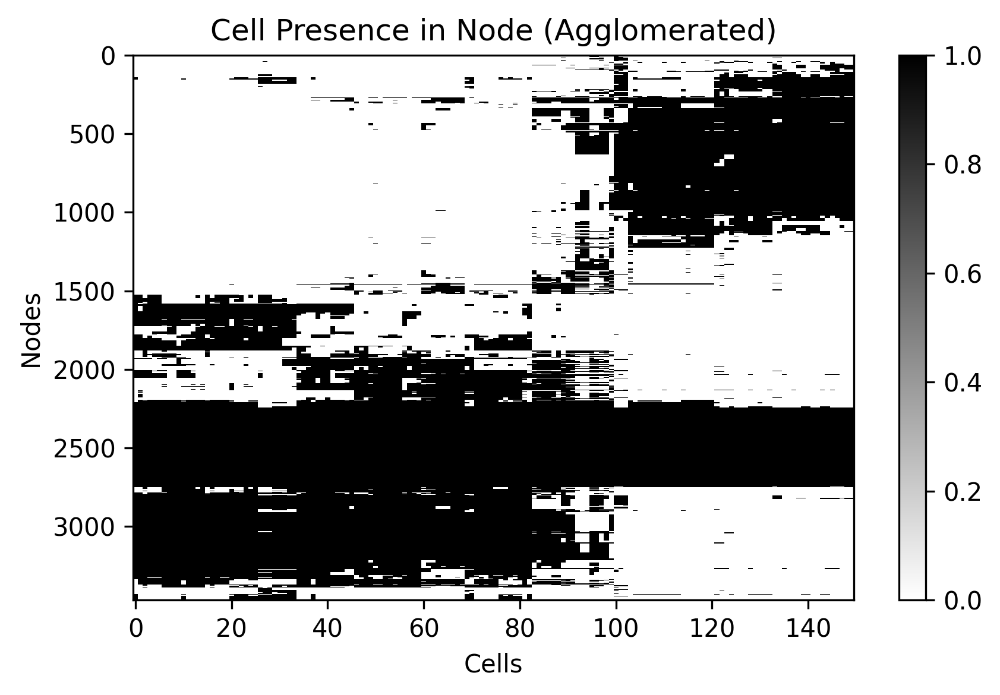

In [21]:
# Now we can take a quick look at the nodes in our forest. 

nodes = forest.nodes(
    depth = 2
    # So as not to overwhelm our computer we can work with nodes of a restricted depth for the moment.
    # (of course an iris definitely won't overwhelm your computer, but if you are following along 
    # with this tutorial using a larger dataset, restricting the depth here will be very helpful. try depth=5)
)

# We will construct some representations of our nodes and visualize them to get an idea of what's happening in 
# our forest

node_sample_encoding = forest.node_representation(nodes,mode='sample')
# A node sample encoding is a binary matrix of node x sample. Each element i,j is 1 if node i contains sample j,
# and 0 otherwise. 

# If nodes frequently contain the same samples, this will likely indicate that those samples are similar in some way.

from scipy.cluster.hierarchy import linkage,dendrogram

sample_agglomeration = dendrogram(linkage(node_sample_encoding.T, metric='cosine', method='average'), no_plot=True)['leaves']
node_sample_agglomeration = dendrogram(linkage(node_sample_encoding, metric='cosine', method='average'), no_plot=True)['leaves']

plt.figure()
plt.title("Cell Presence in Node (Agglomerated)")
plt.imshow(node_sample_encoding[node_sample_agglomeration].T[sample_agglomeration].T,cmap='binary',aspect='auto',interpolation='none')
plt.xlabel("Cells")
plt.ylabel("Nodes")
plt.colorbar()
plt.tight_layout()
plt.show()


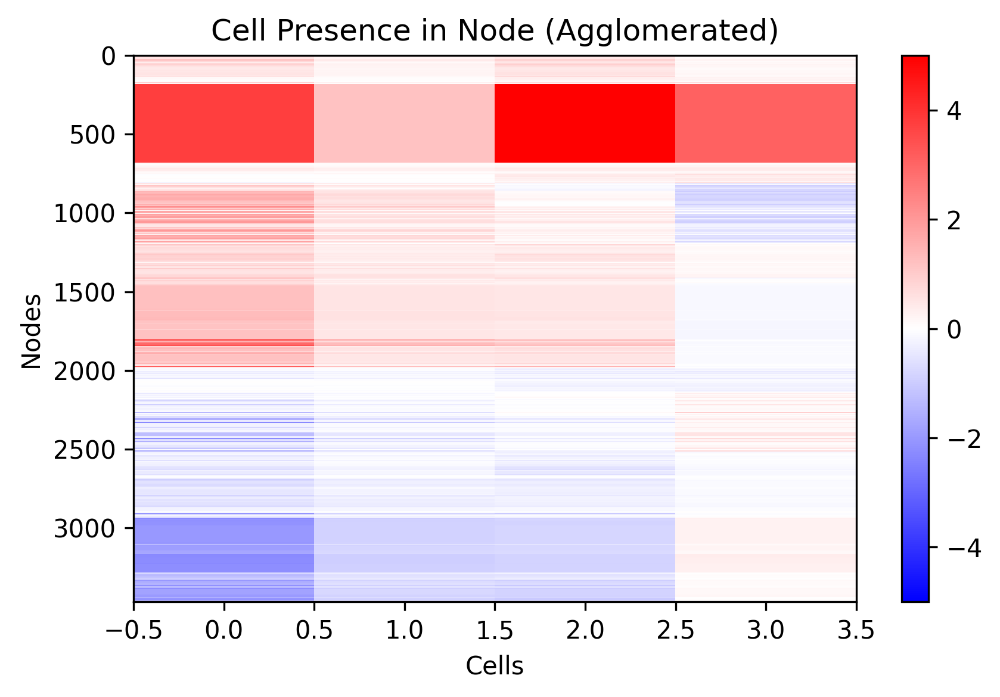

In [25]:
# Now let's look at a few other kinds of encodings

node_gain_encoding = forest.node_representation(nodes,mode='conditional_gain')

# A conditional gain encoding is a matrix of nodes x features, where element i,j is the difference in the mean for
# feature j in node i compared to the parent of node i. It represents the "prediction" or regression that each 
# node makes. 

feature_agglomeration = dendrogram(linkage(node_gain_encoding.T, metric='cosine', method='average'), no_plot=True)['leaves']
node_gain_agglomeration = dendrogram(linkage(node_gain_encoding, metric='cosine', method='average'), no_plot=True)['leaves']

plt.figure()
plt.title("Cell Presence in Node (Agglomerated)")
plt.imshow(node_gain_encoding[node_gain_agglomeration].T[feature_agglomeration].T,cmap='bwr',vmin=-5,vmax=5,aspect='auto',interpolation='none')
plt.xlabel("Cells")
plt.ylabel("Nodes")
plt.colorbar()
plt.tight_layout()
plt.show()

In [6]:
# Now let's cluster the nodes of our RFR and see if any patterns emerge. 

forest.interpret_splits(
    mode='partial',
    resolution=1,
    k=200,
    pca=4
)

Node 6000

Node 6000

Complete:6603

Searching for partition
Louvain: (6604,)


array([6, 8, 5, ..., 5, 1, 0])

In [7]:
forest.maximum_spanning_tree(
    mode='samples'
)

Max tree debug
[[0.99955508 0.99123888 0.8921595  0.99903385 0.99891701 0.93762141
  0.72270275 0.88724367 0.71913699 0.88750904 0.89191568 0.90129806]
 [0.80948895 0.83273064 0.66615882 0.8102122  0.81155785 0.82015963
  0.62621016 0.69221897 0.62235993 0.6945024  0.64992199 0.70326999]
 [0.70139659 0.65520917 0.82704342 0.68560253 0.68316215 0.49915305
  0.14937869 0.88940408 0.14429718 0.89231539 0.78532127 0.87634467]
 [0.69081152 0.75486166 0.29838956 0.70865507 0.71199955 0.88710108
  0.99427153 0.28323502 0.99464873 0.285288   0.31496252 0.31131713]
 [0.80344883 0.73859285 0.97918403 0.78832474 0.78544133 0.55630308
  0.17519549 0.98322913 0.17000743 0.98172424 0.96621034 0.97941963]
 [0.86365834 0.87744553 0.66131119 0.86924813 0.8691724  0.88672575
  0.81033148 0.64247377 0.80966913 0.64289275 0.67276276 0.66543659]
 [0.60015257 0.68759095 0.19135402 0.61774112 0.62096347 0.83904037
  0.94617749 0.18324837 0.94726487 0.18565916 0.20079858 0.21975831]
 [0.85484121 0.80279352 0.

[0,
 [[1, []],
  [3, [[6, []], [8, []]]],
  [4, [[2, []], [7, []], [9, []], [10, []], [11, []]]],
  [5, []]]]

Now we would like to visualize the approximate consensus tree structure in our random forest. 

The next function should provide you with an HTML report of the forest. (Please be patient, it takes a little while to render the complete report) 

Summarizing:0
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


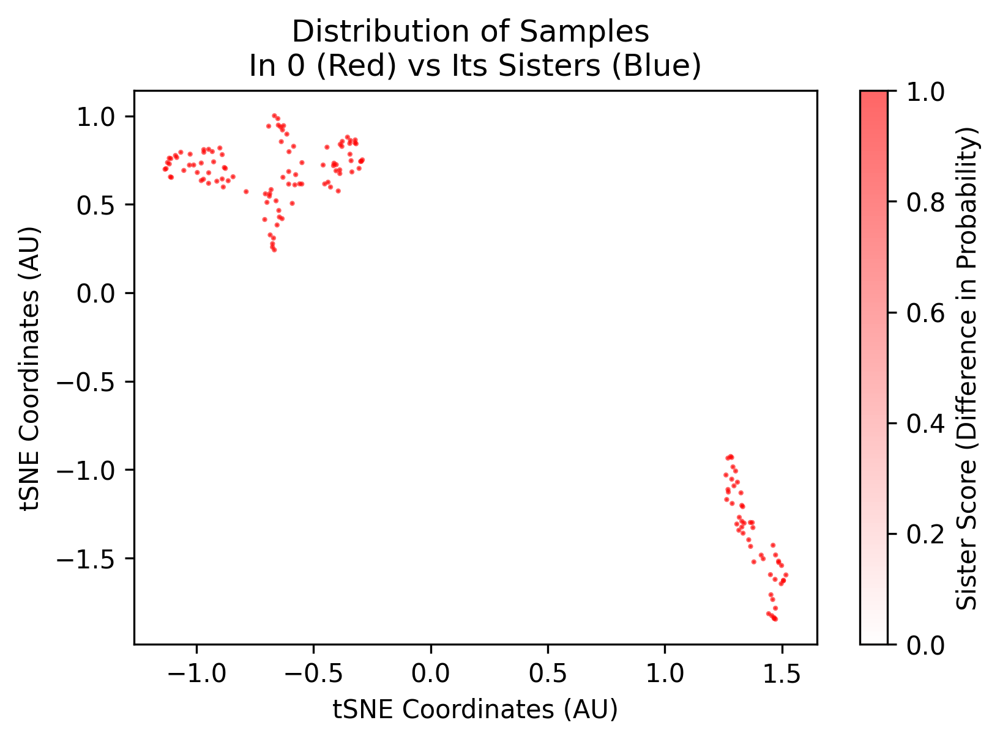

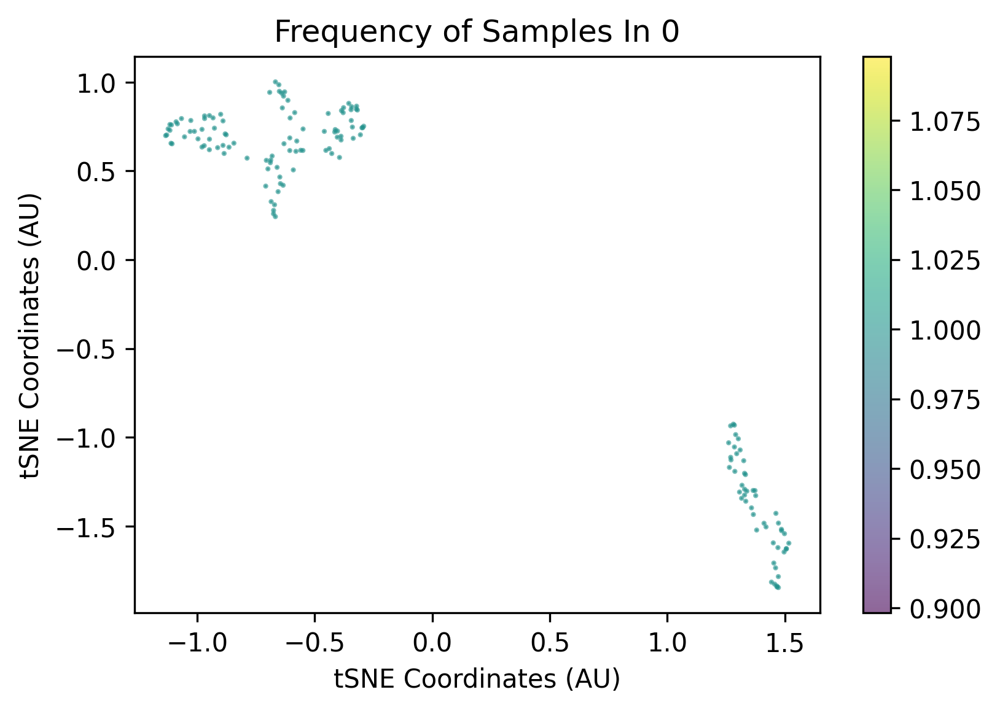

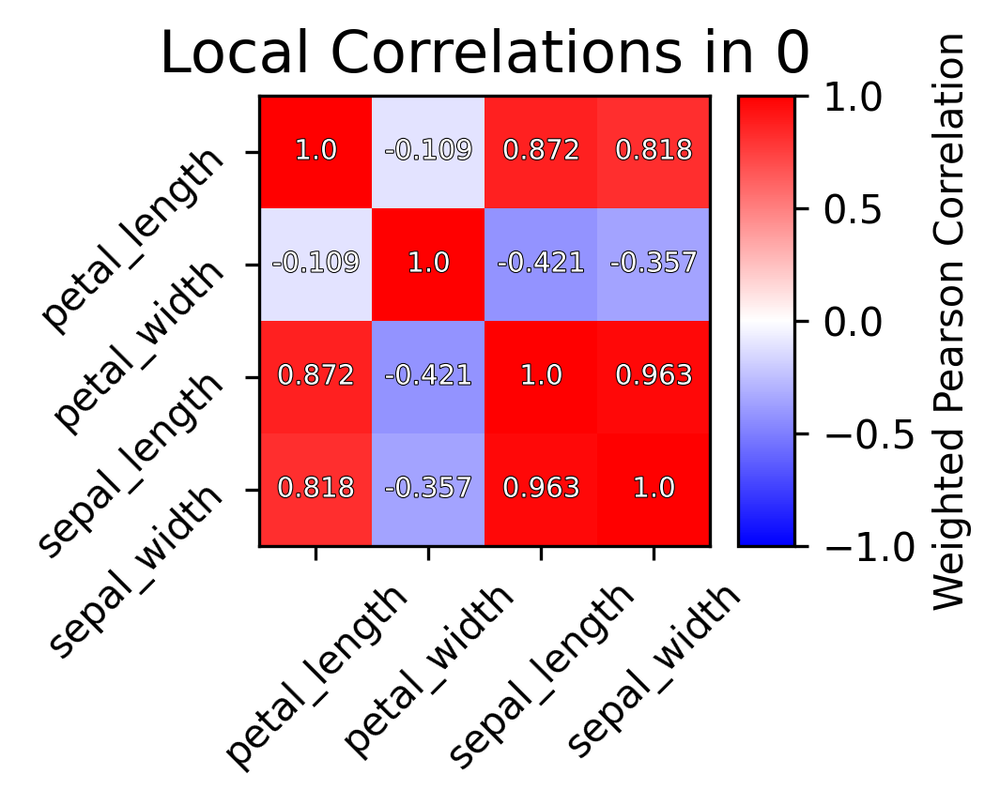

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


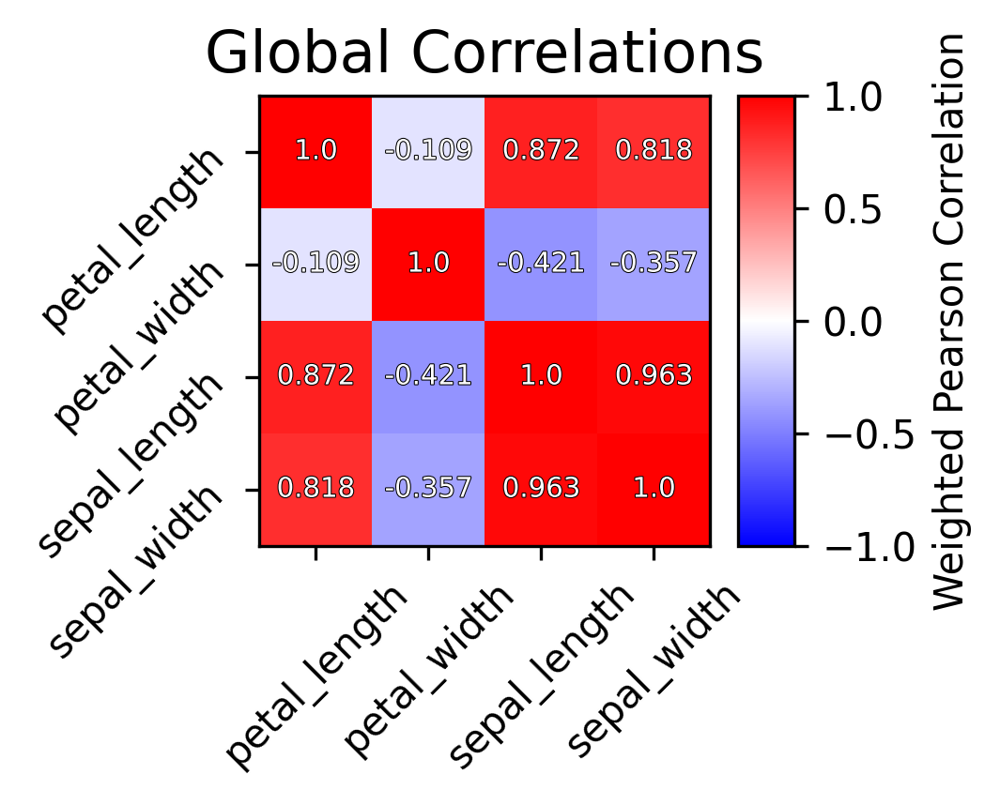

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/0/
Summarizing:1
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[16.46823311  4.43876572 91.59413995 17.17241966],A:[18.62737591  4.82877344 92.05638016 17.52008387]
Error ratio: [0.8899933  0.93308923 0.99503269 0.98122772]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


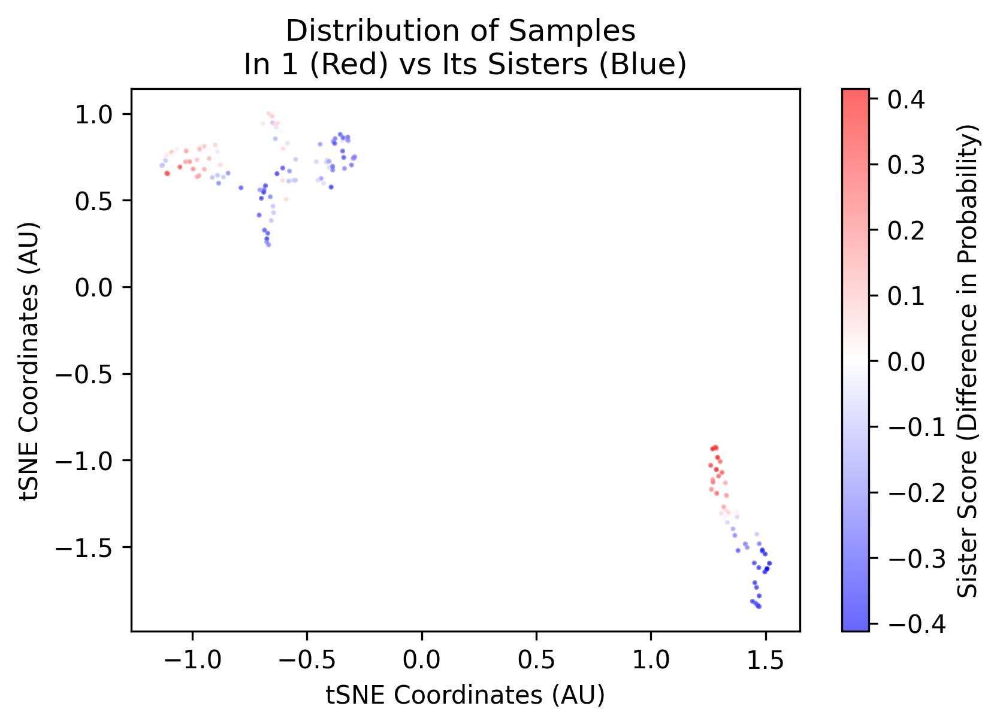

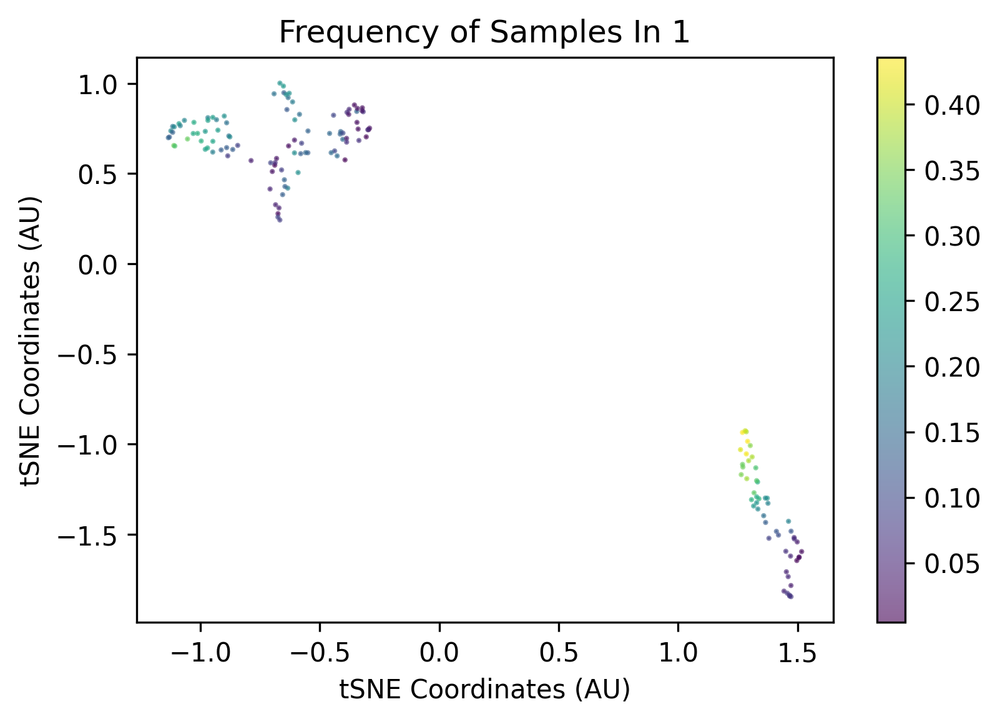

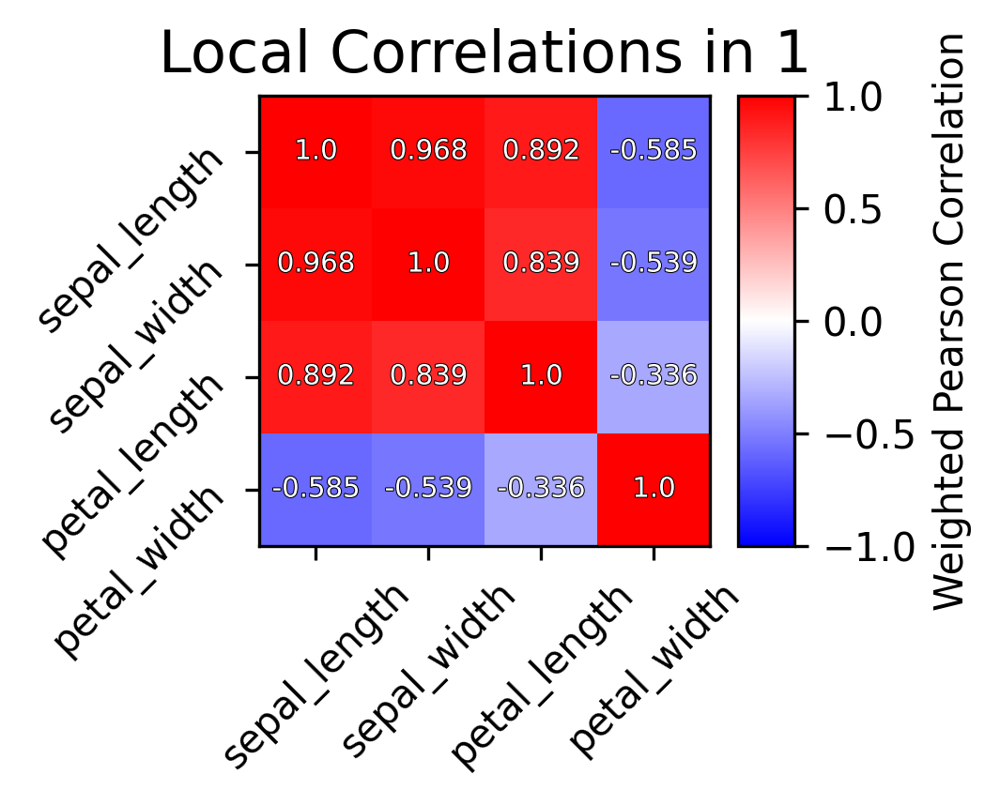

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


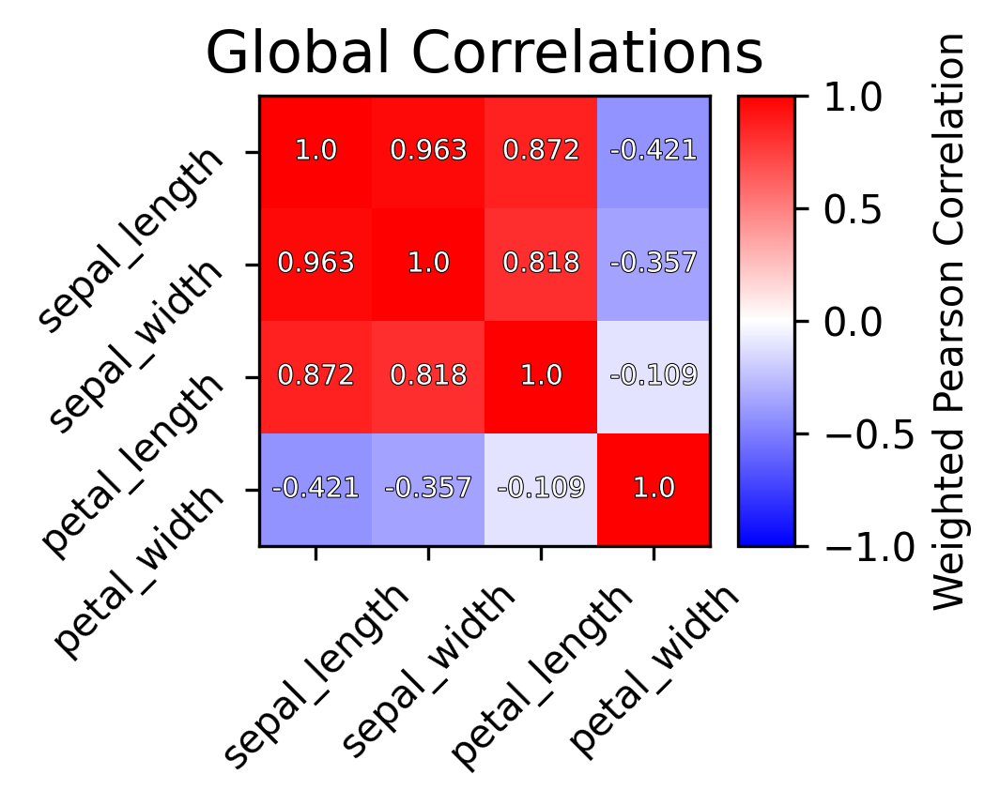

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/1/
Summarizing:2
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[12.8656887   3.02656621 31.90399395  6.91410143],A:[16.78529739  3.03605311 49.40322037 11.35912797]
Error ratio: [0.77961523 0.99764946 0.65281531 0.64034465]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


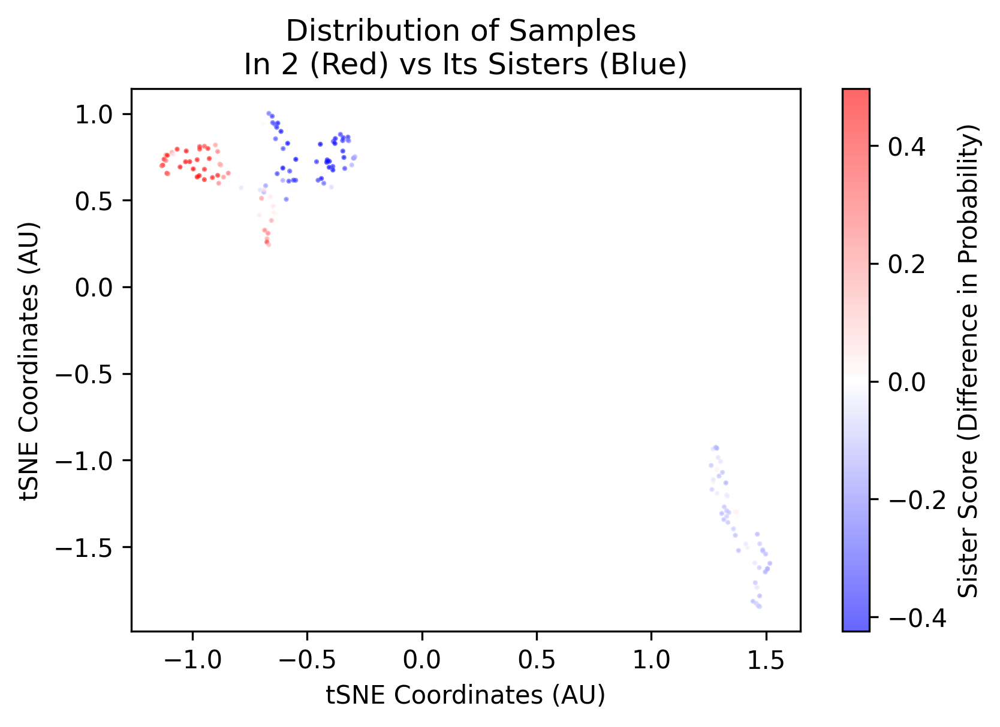

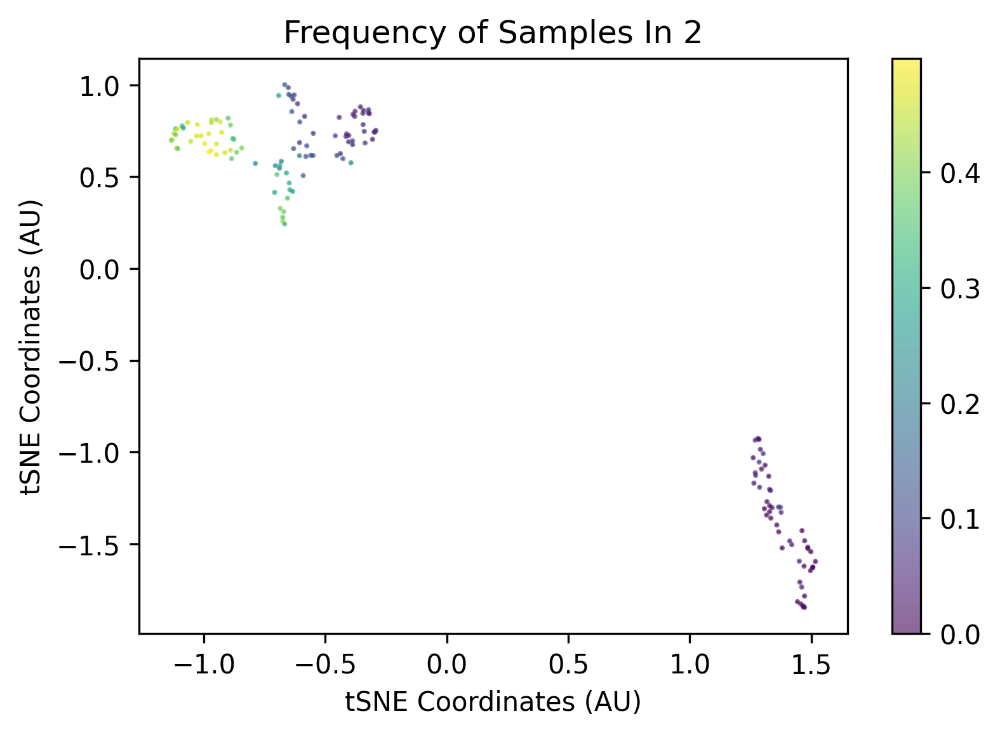

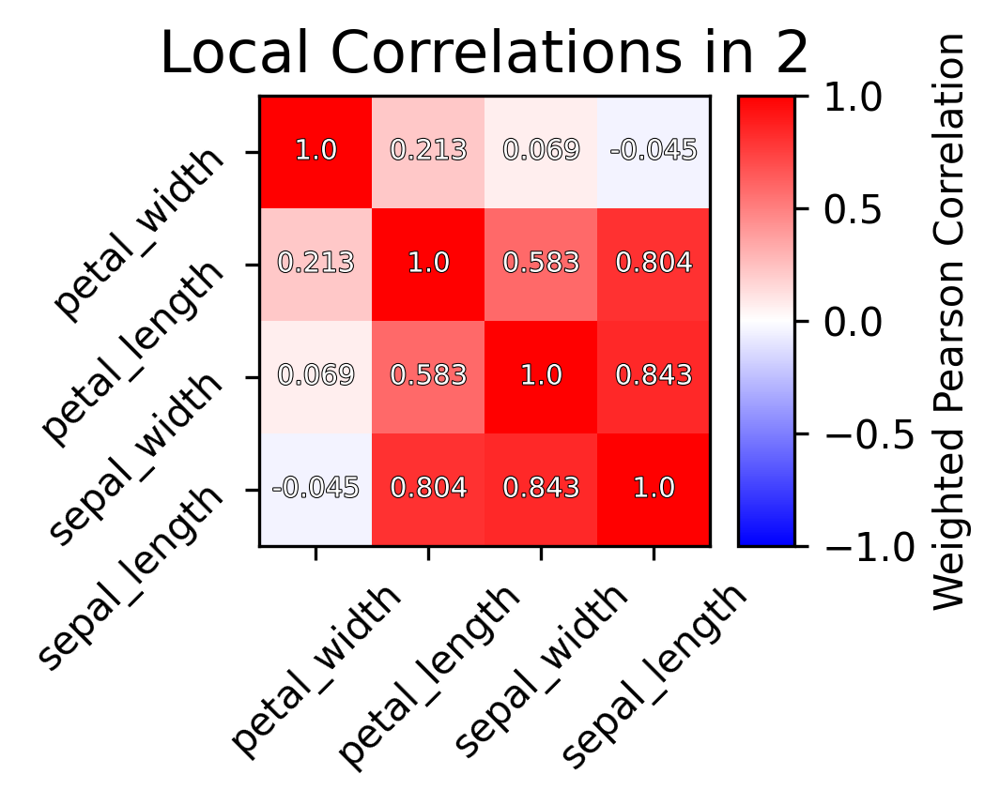

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


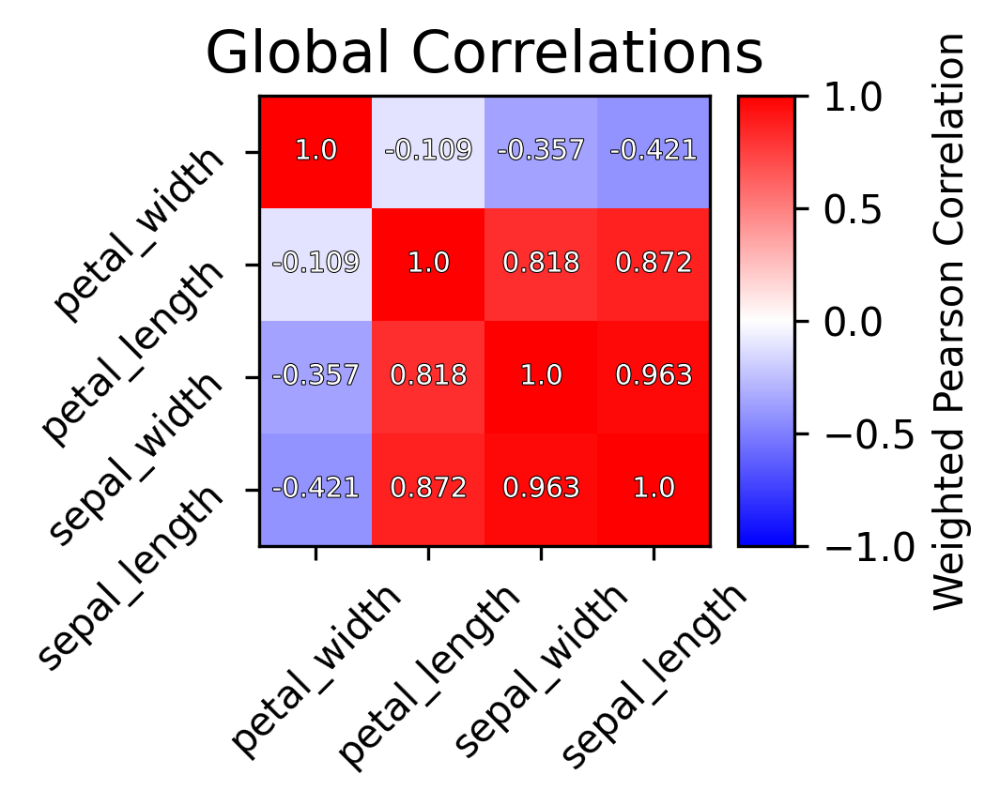

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/2/
Summarizing:3
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[10.60043865 12.24209755 58.84951364  9.97863084],A:[ 33.85739091  13.77724517 198.75920969  34.88900919]
Error ratio: [0.3327971  0.89611409 0.29960828 0.3059051 ]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


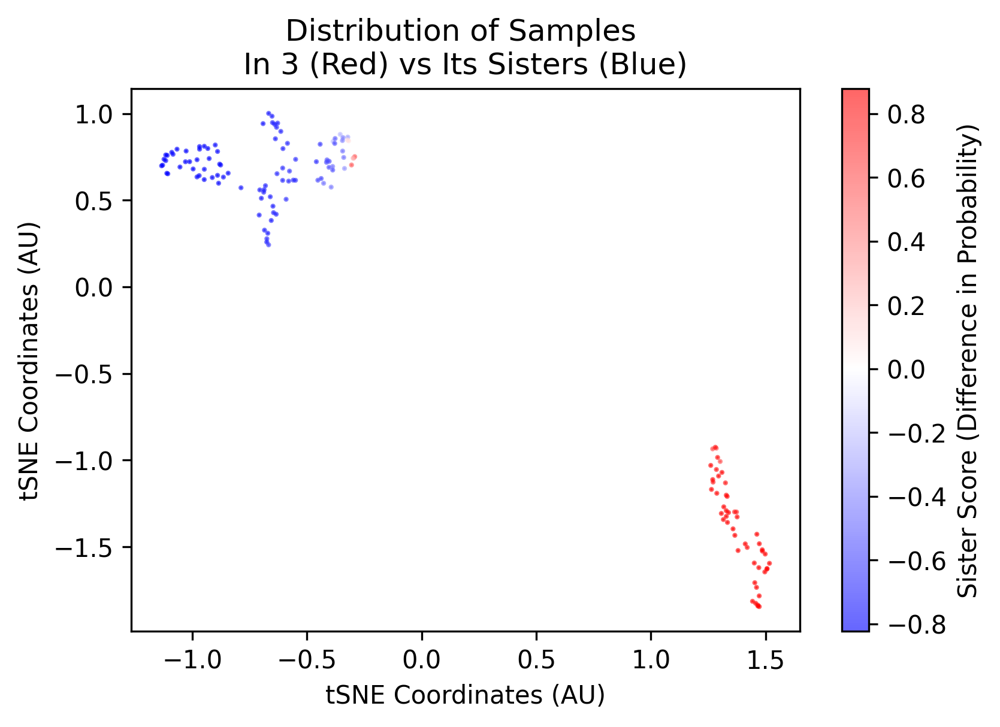

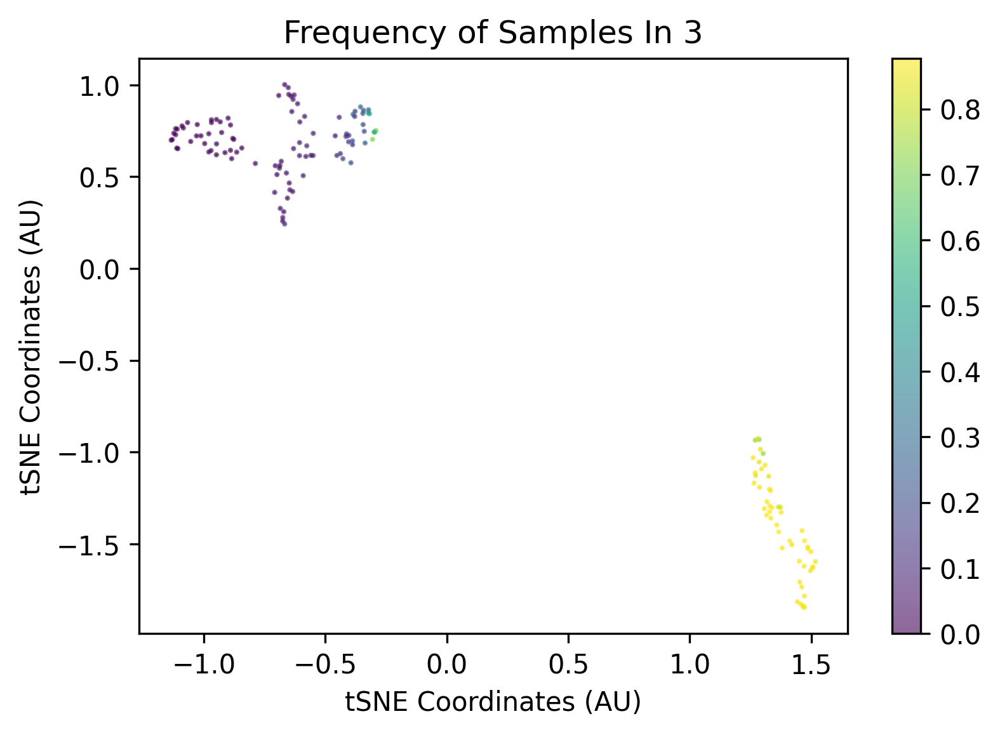

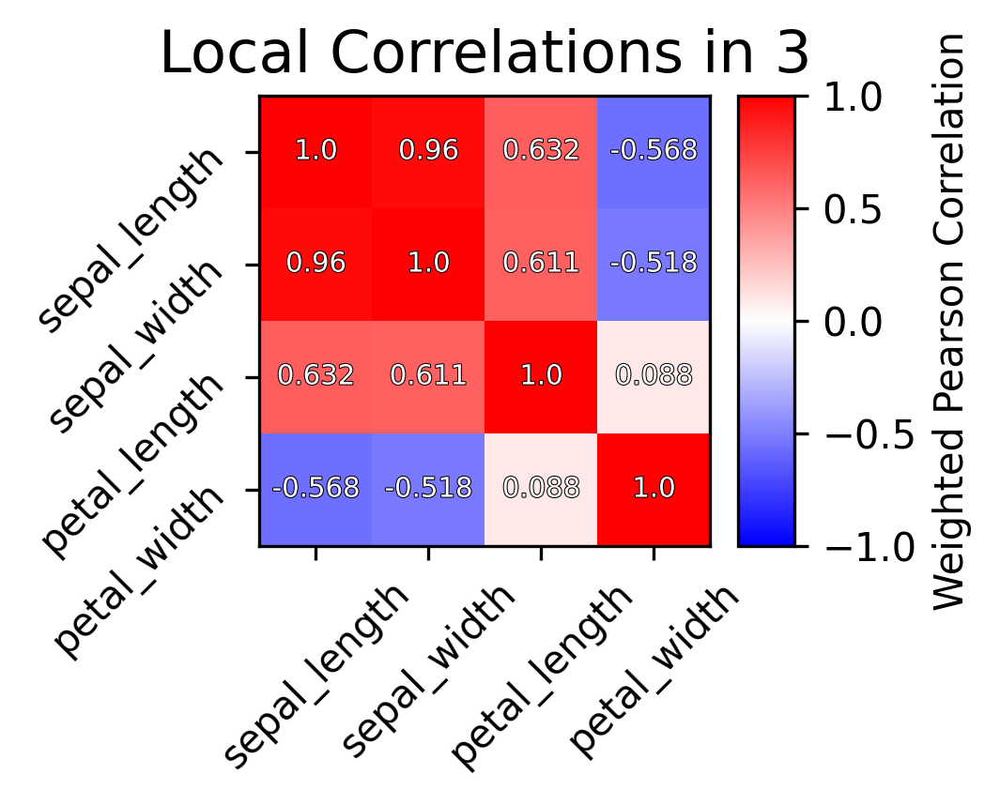

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


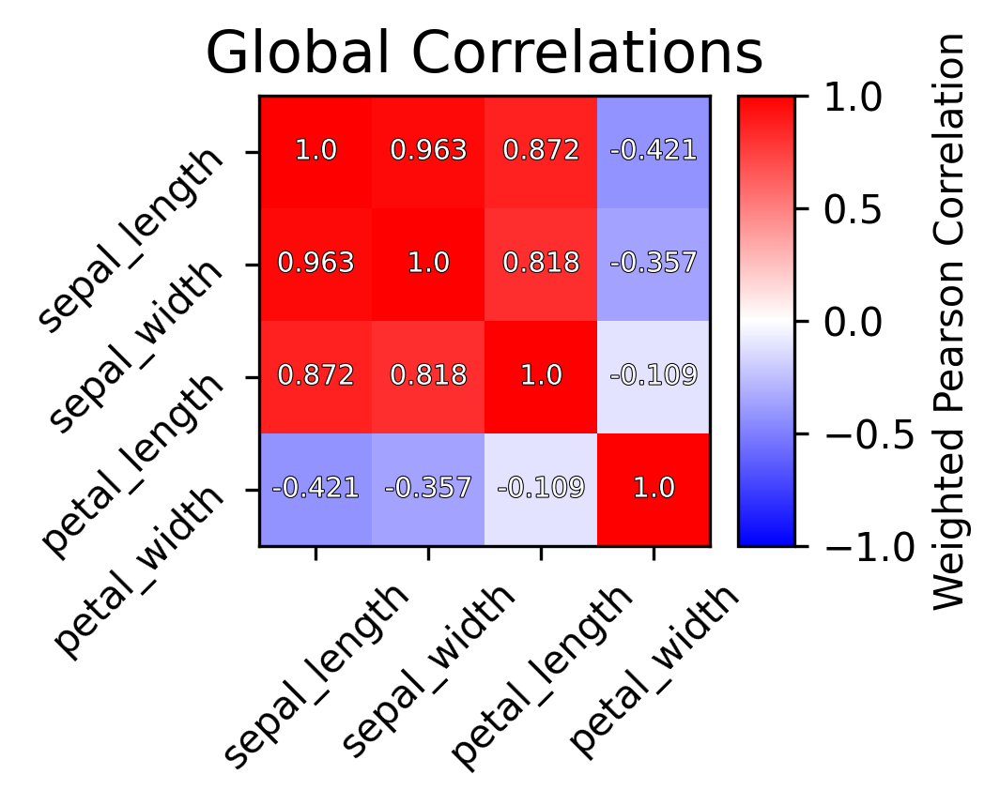

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/3/
Summarizing:4
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[29.93632723  8.29199536 54.51525881 13.96601747],A:[ 52.84294304  10.51583913 199.79413942  39.47523876]
Error ratio: [0.57456605 0.80688826 0.27647848 0.36975736]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


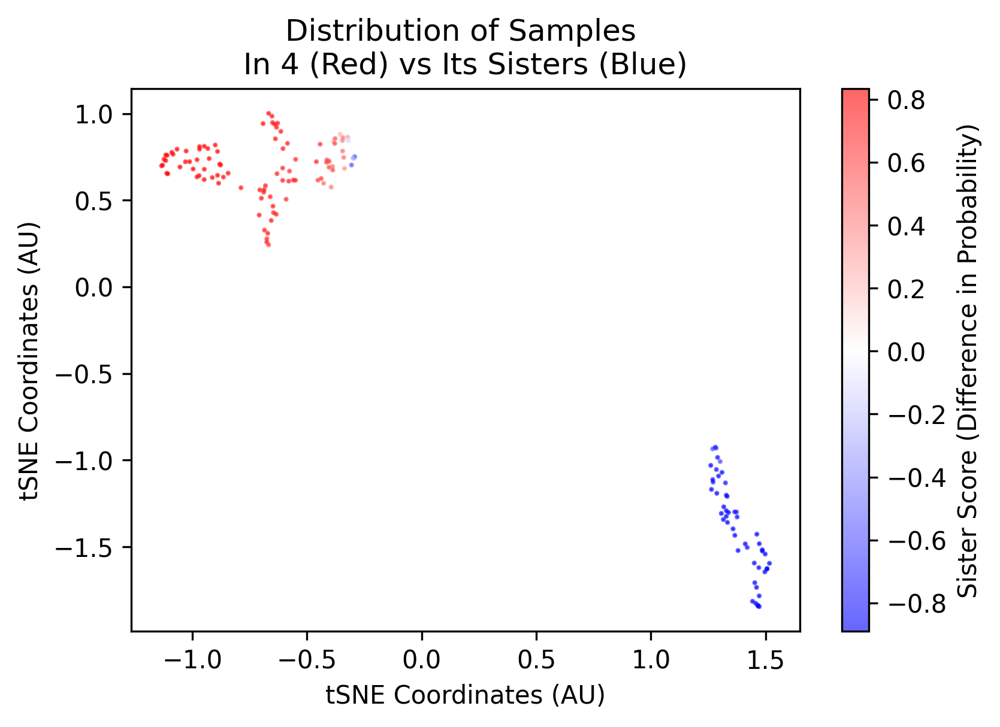

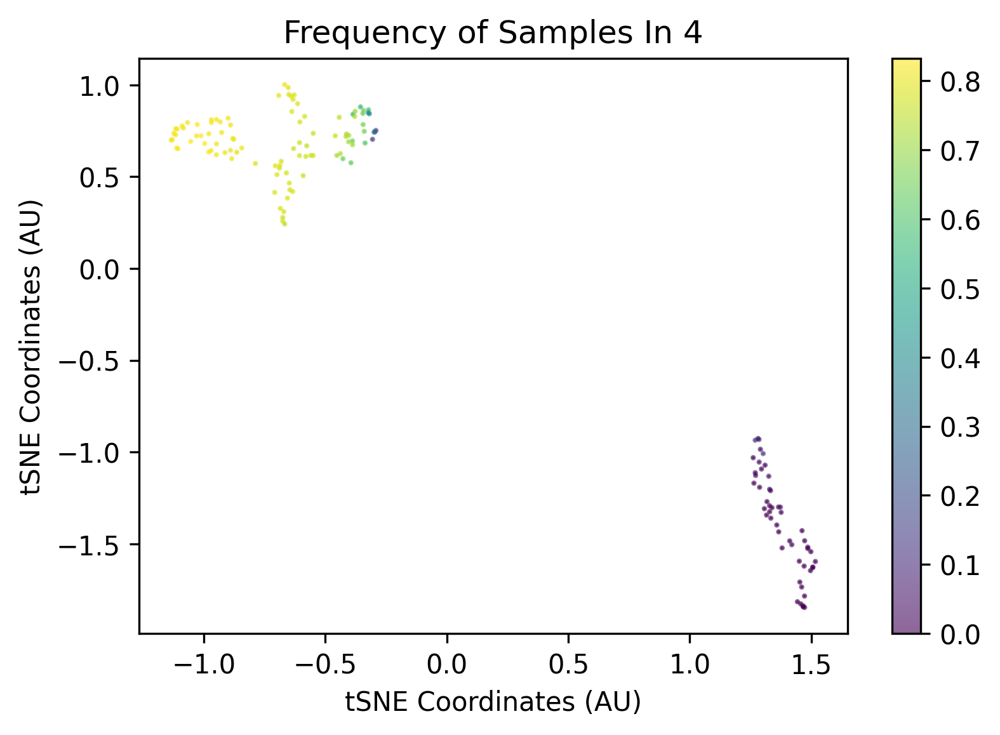

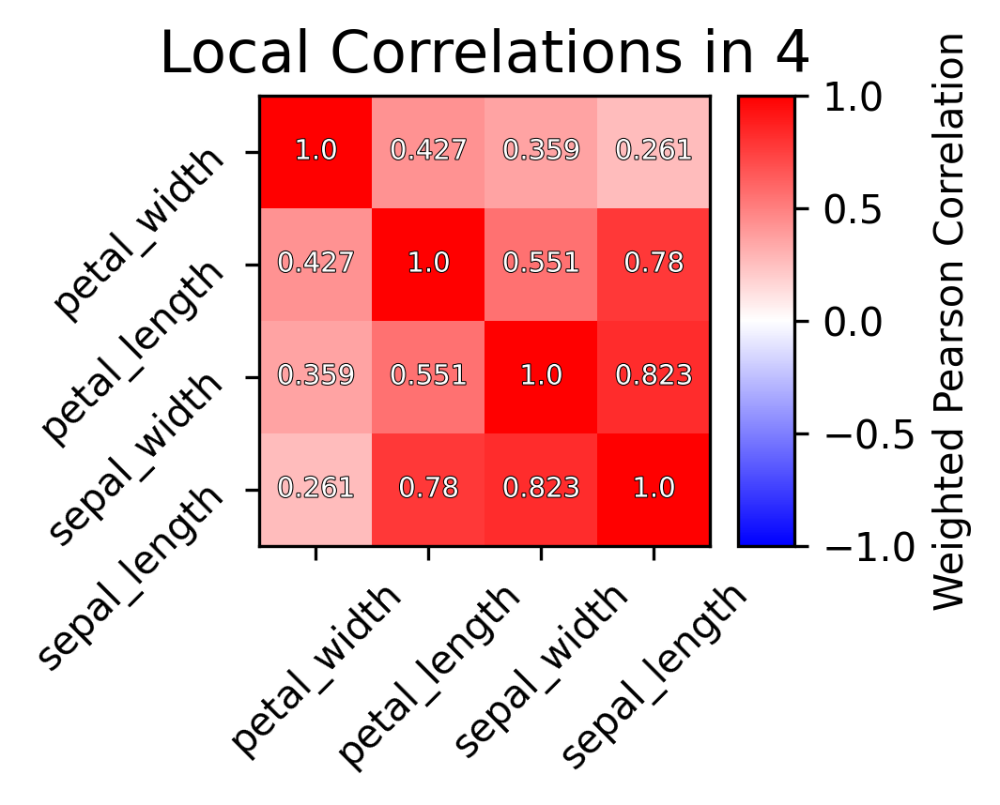

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


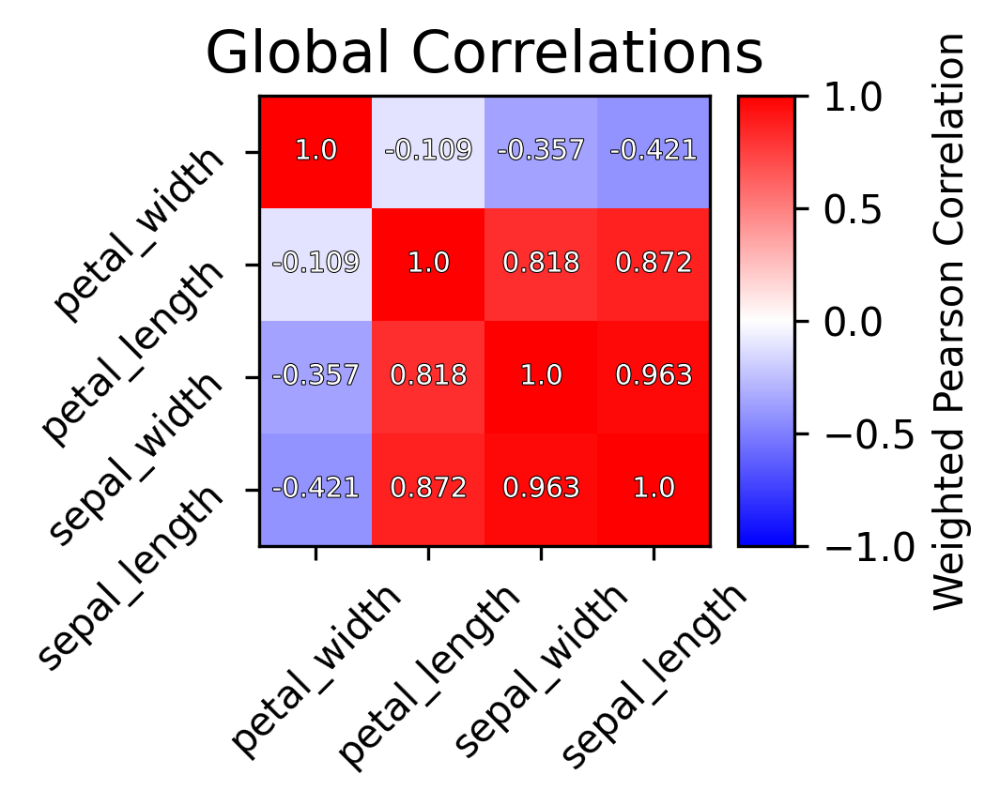

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/4/
Summarizing:5
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[ 24.36294757   4.82142174 112.86091308  20.30655799],A:[ 22.98011563   6.72680735 113.53464707  20.23903978]
Error ratio: [1.05766577 0.75340583 0.99411764 1.00317897]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


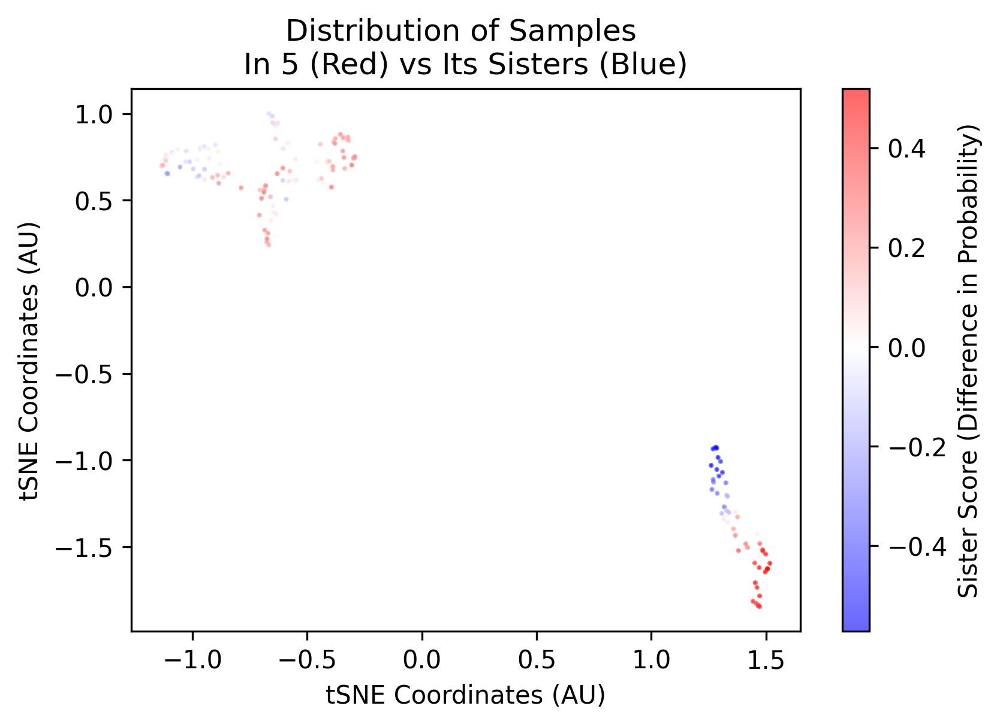

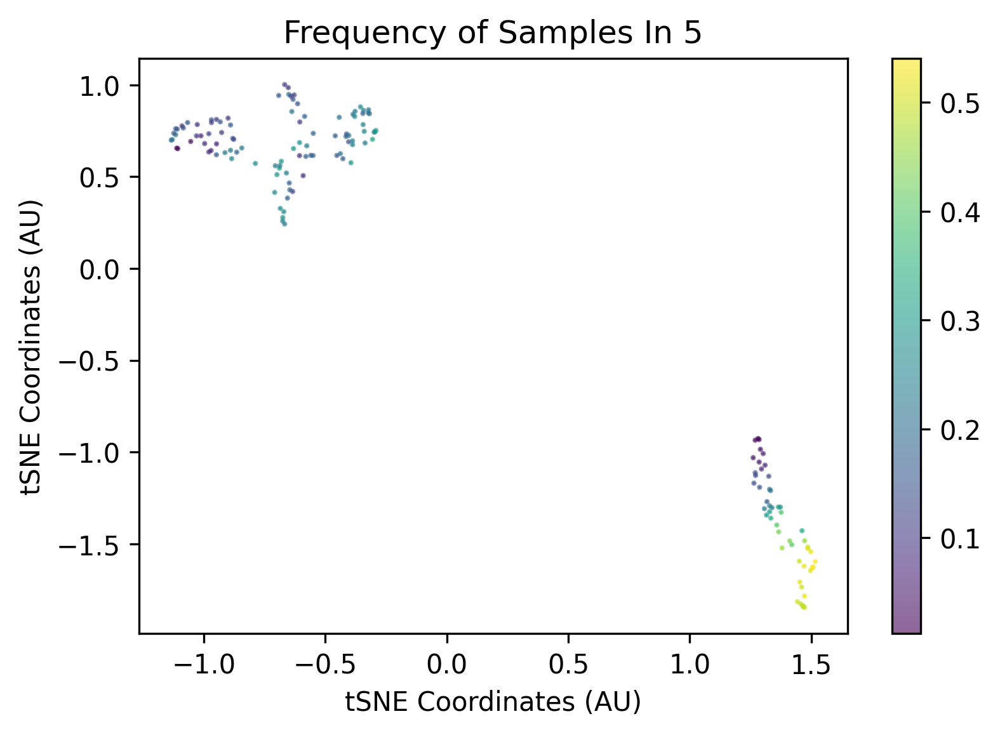

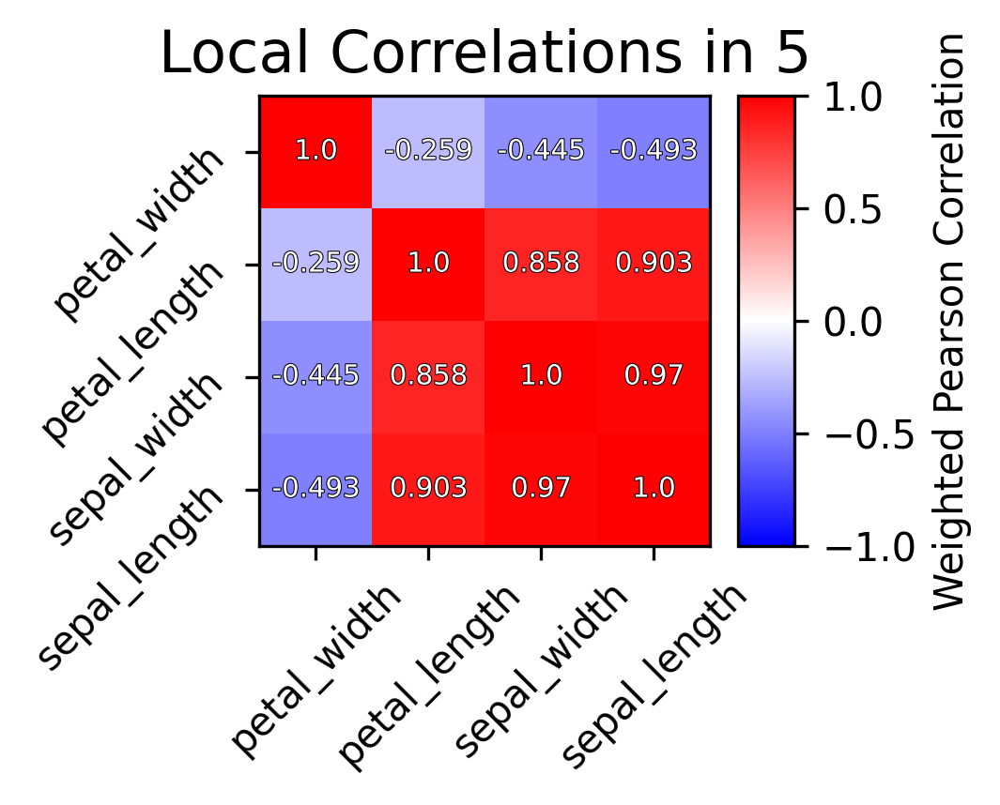

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


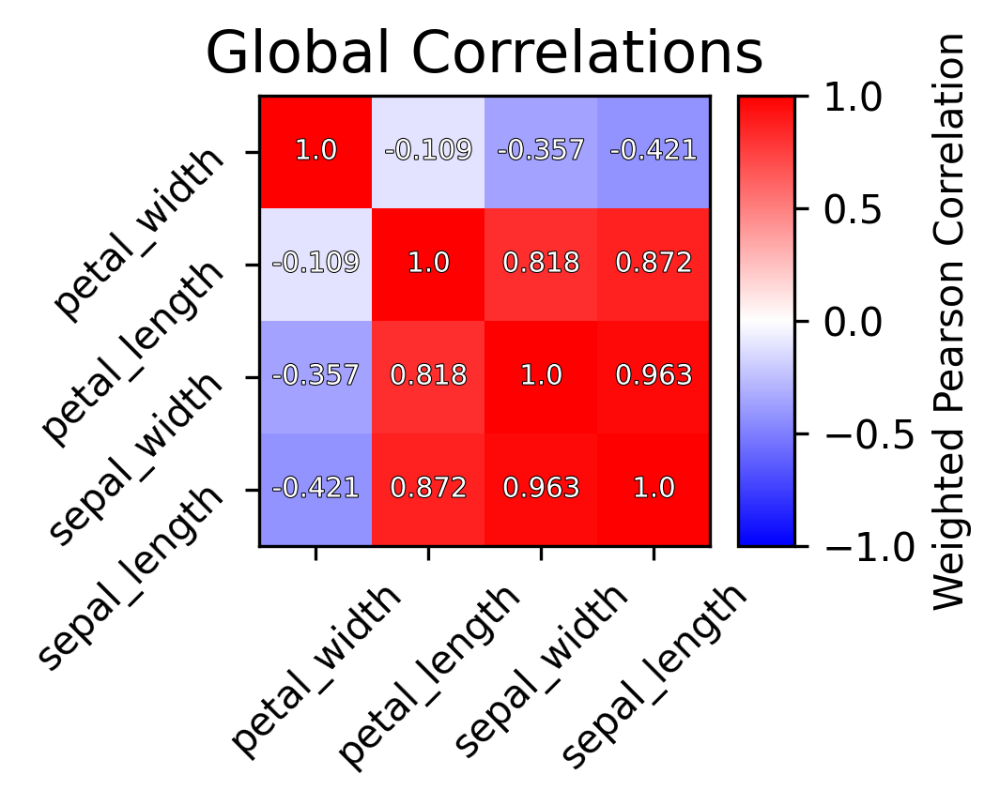

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/5/
Summarizing:6
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[4.28910429 4.66762097 6.04195445 1.23090497],A:[ 4.88233589  6.04708655 18.71609256  3.28768084]
Error ratio: [0.89915033 0.80425023 0.35716785 0.52030574]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


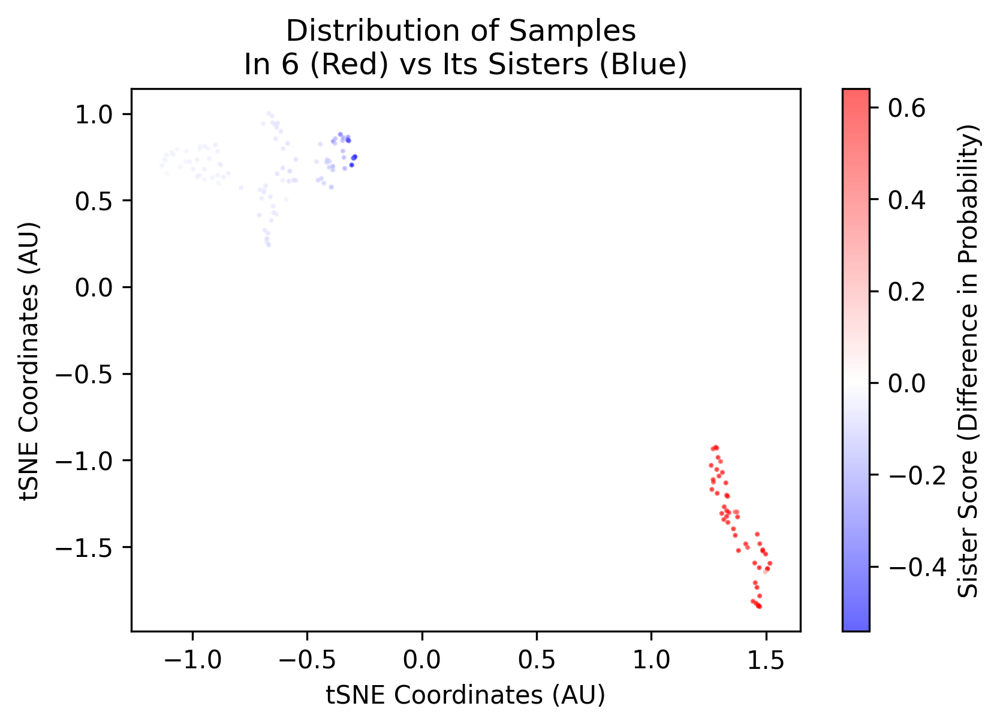

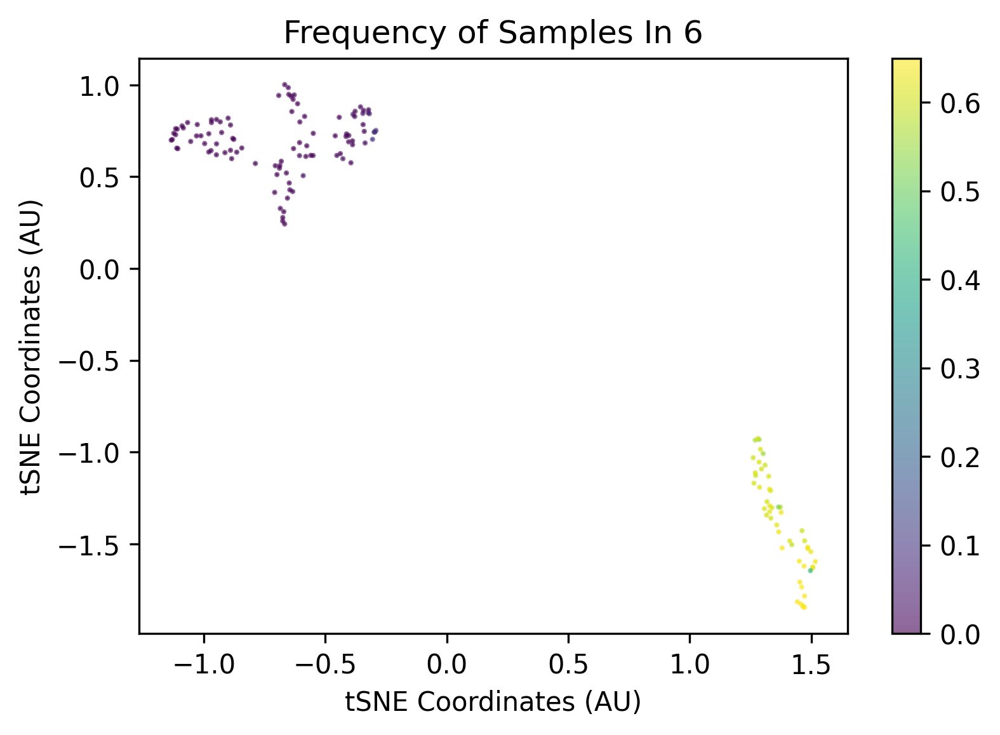

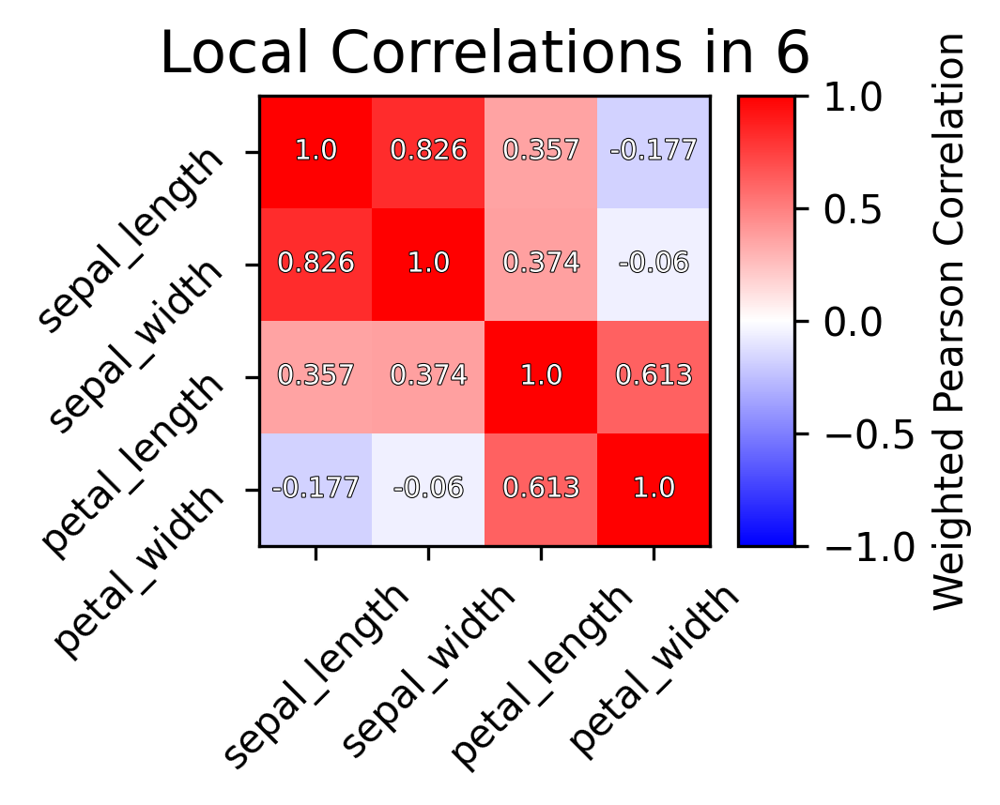

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


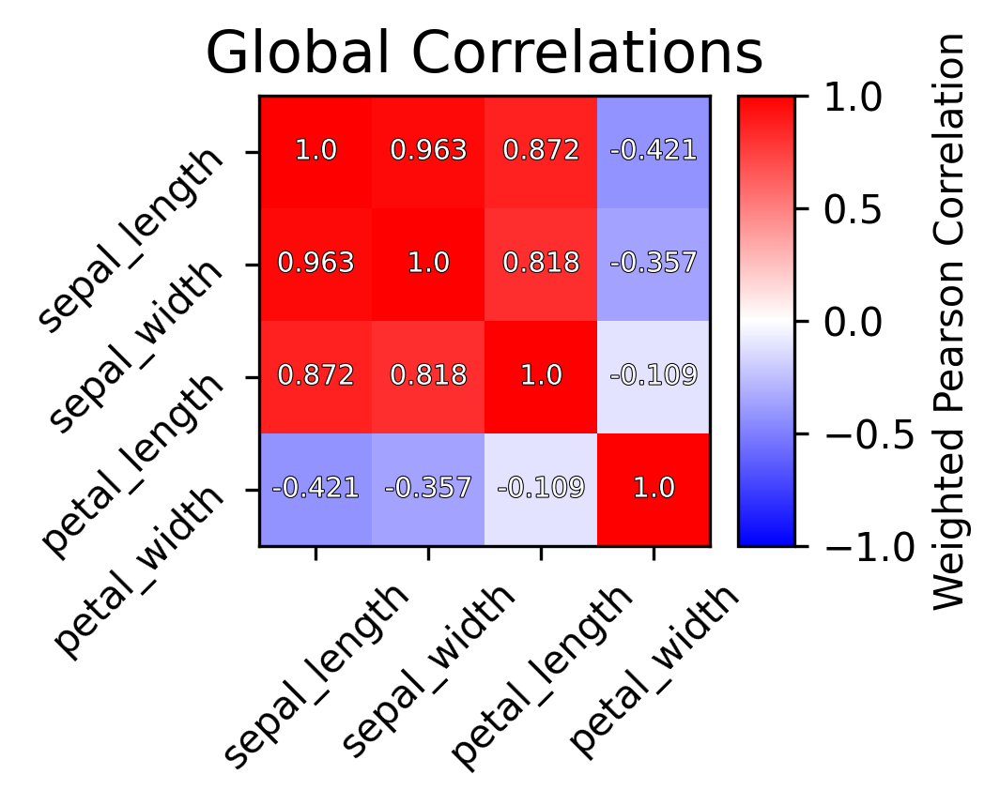

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/6/
Summarizing:7
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[12.10097753  3.62614483 47.81246305 11.21453173],A:[13.57437804  3.63577139 49.28858726 11.31455165]
Error ratio: [0.89890474 0.99792342 0.97064693 0.99187791]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


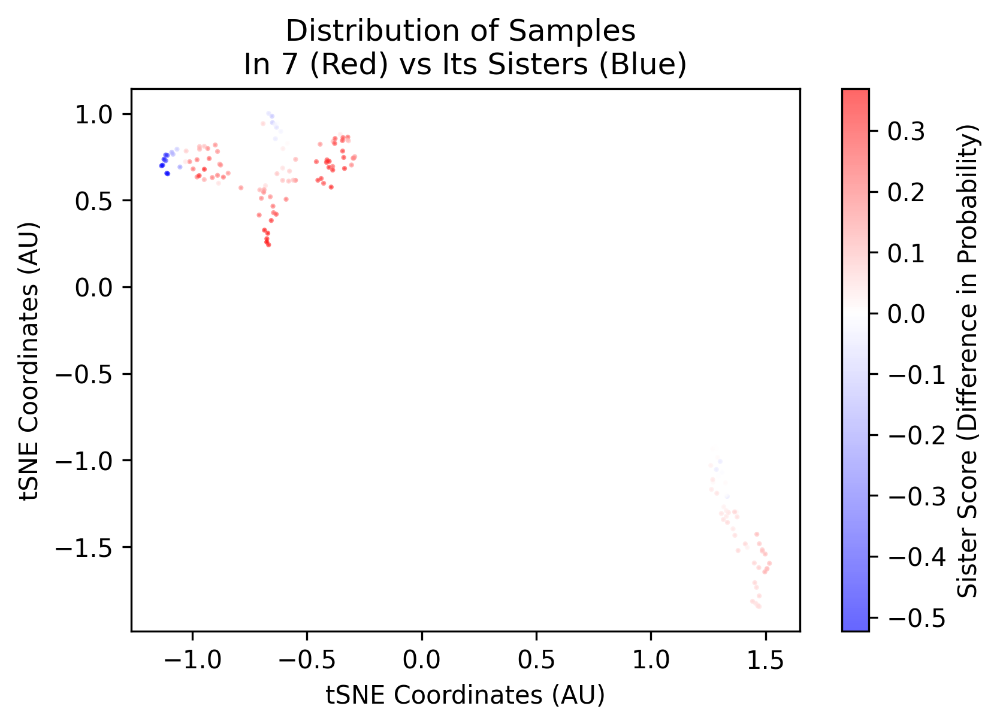

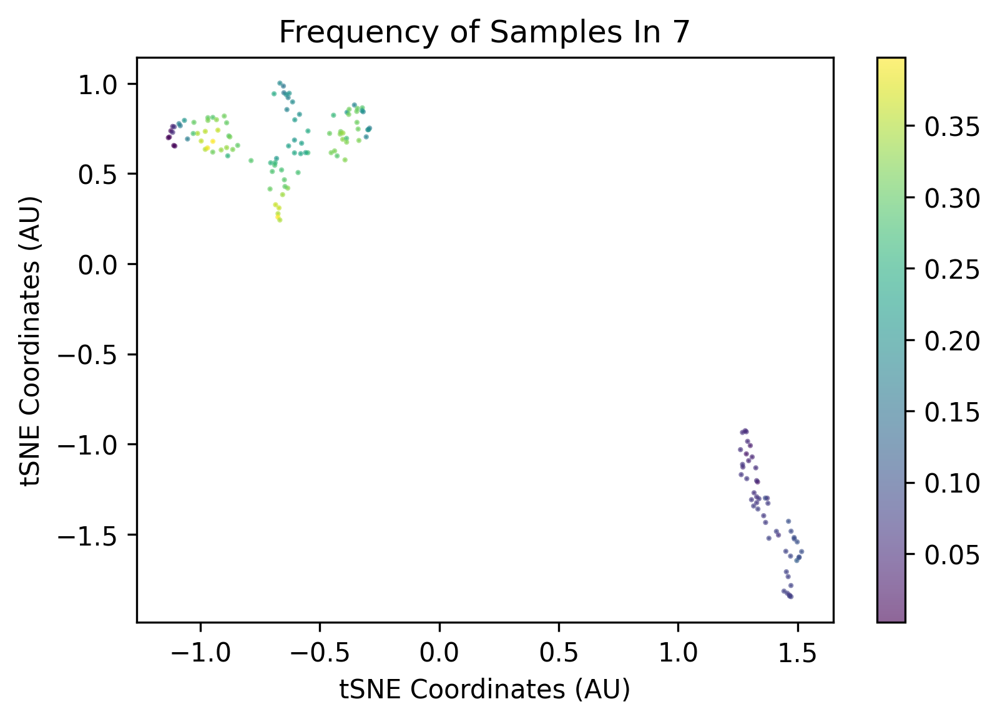

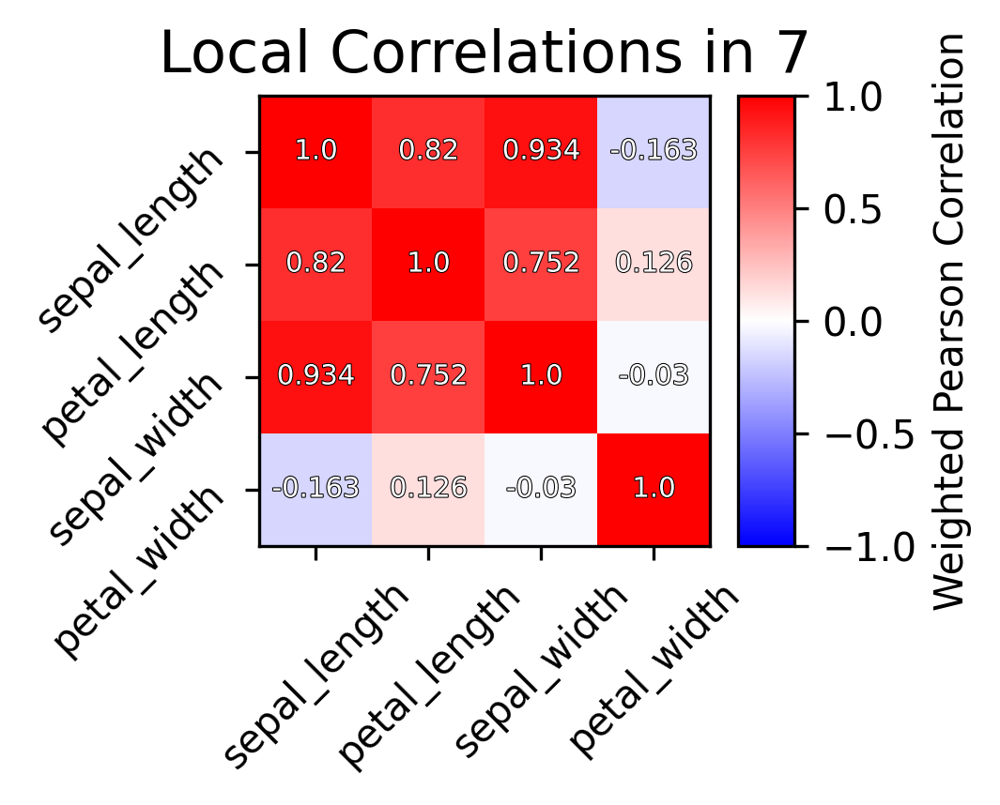

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


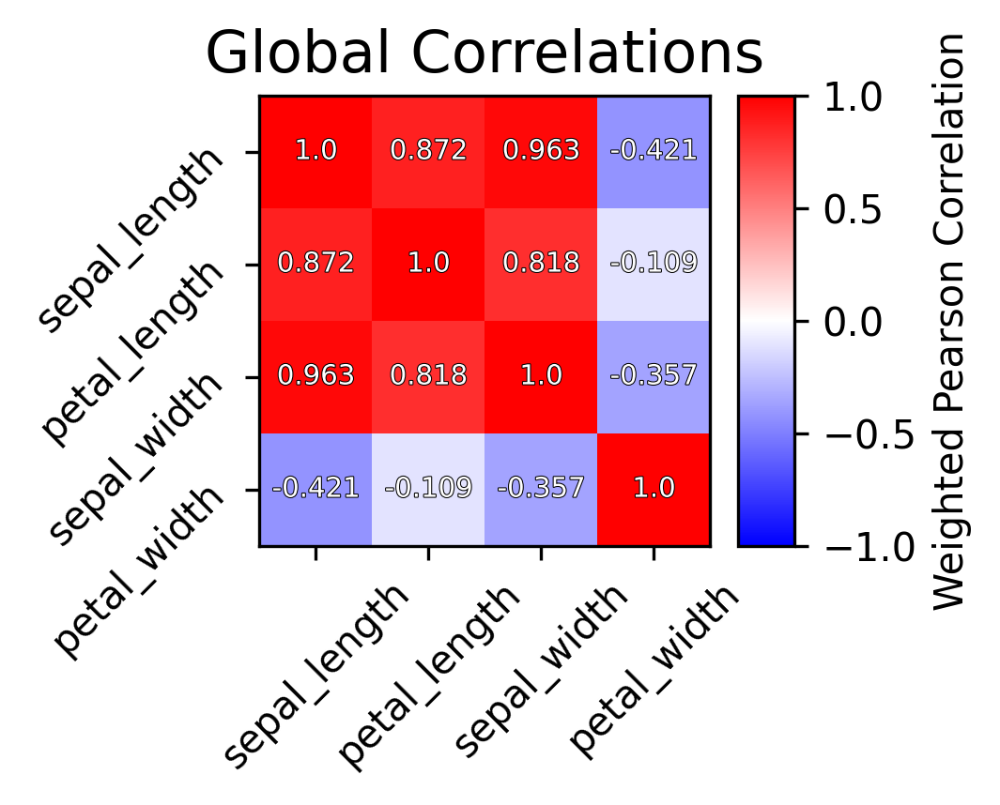

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/7/
Summarizing:8
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[ 5.77488933  1.85005645 16.63811059  3.08138425],A:[ 6.93344247  4.34996671 46.8501479   8.11240107]
Error ratio: [0.8539659  0.53272415 0.36861141 0.4478934 ]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


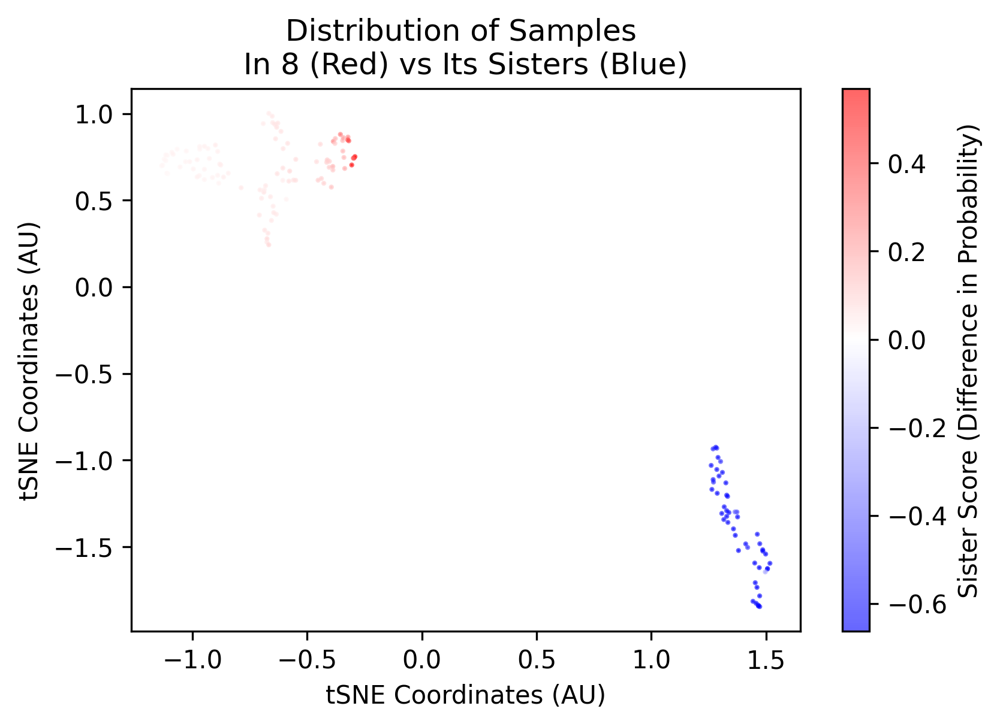

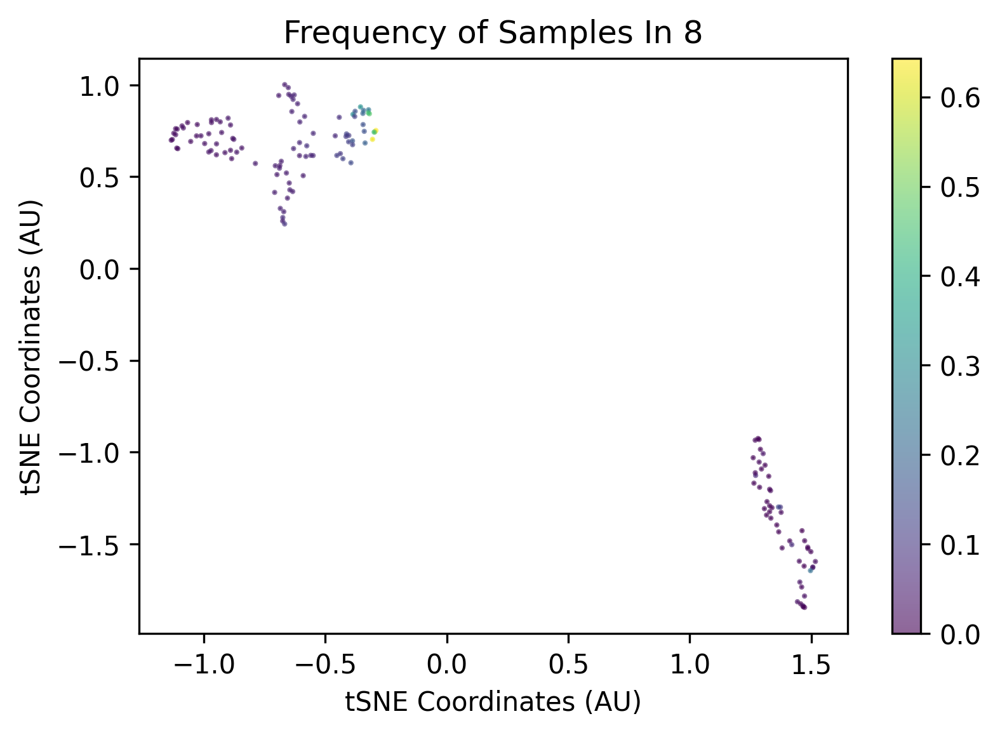

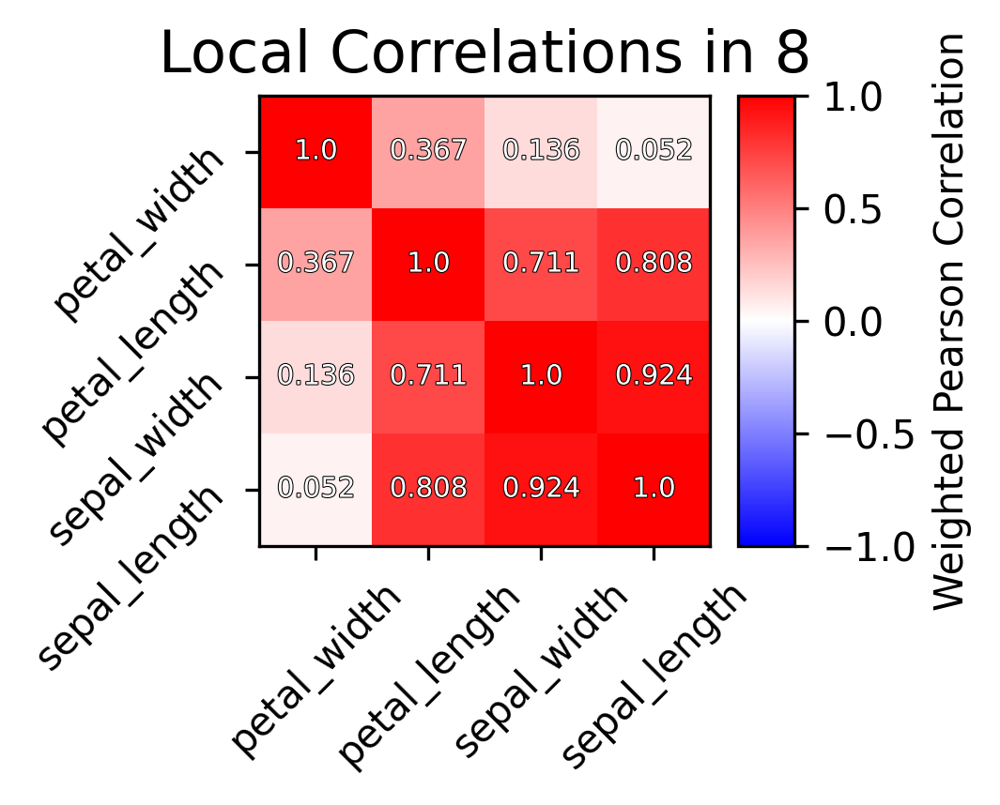

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


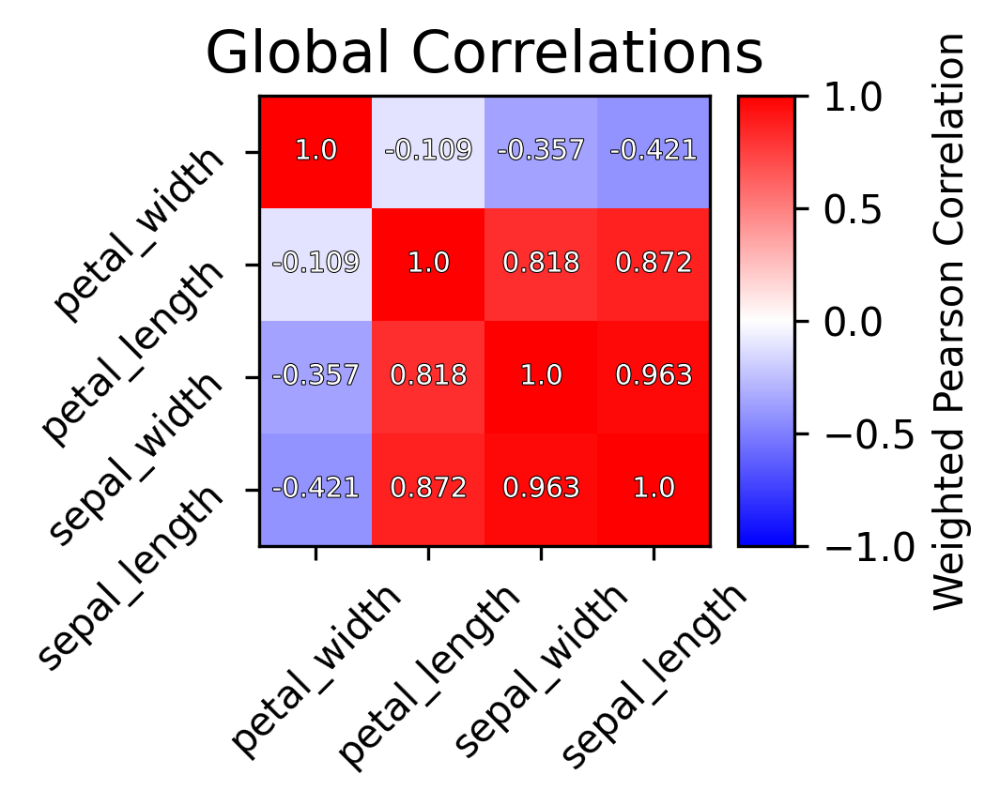

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/8/
Summarizing:9
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[10.04846794  2.50620168 30.3863337   5.44414887],A:[12.42675449  2.56851414 32.96141375  5.62965642]
Error ratio: [0.82286959 0.98253826 0.9241763  0.97201853]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


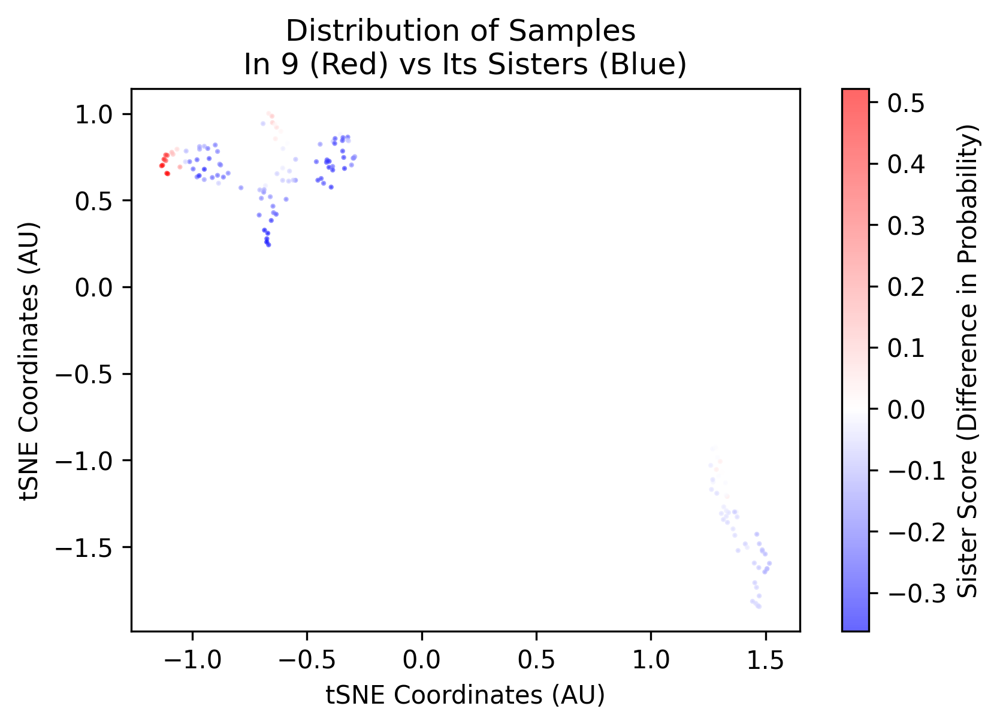

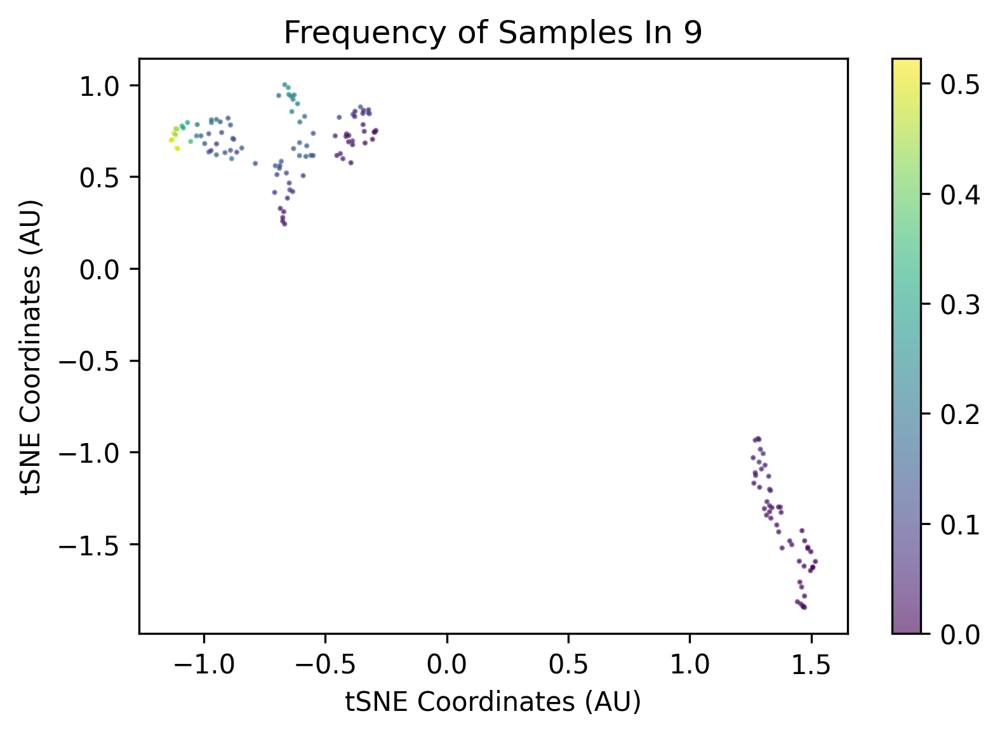

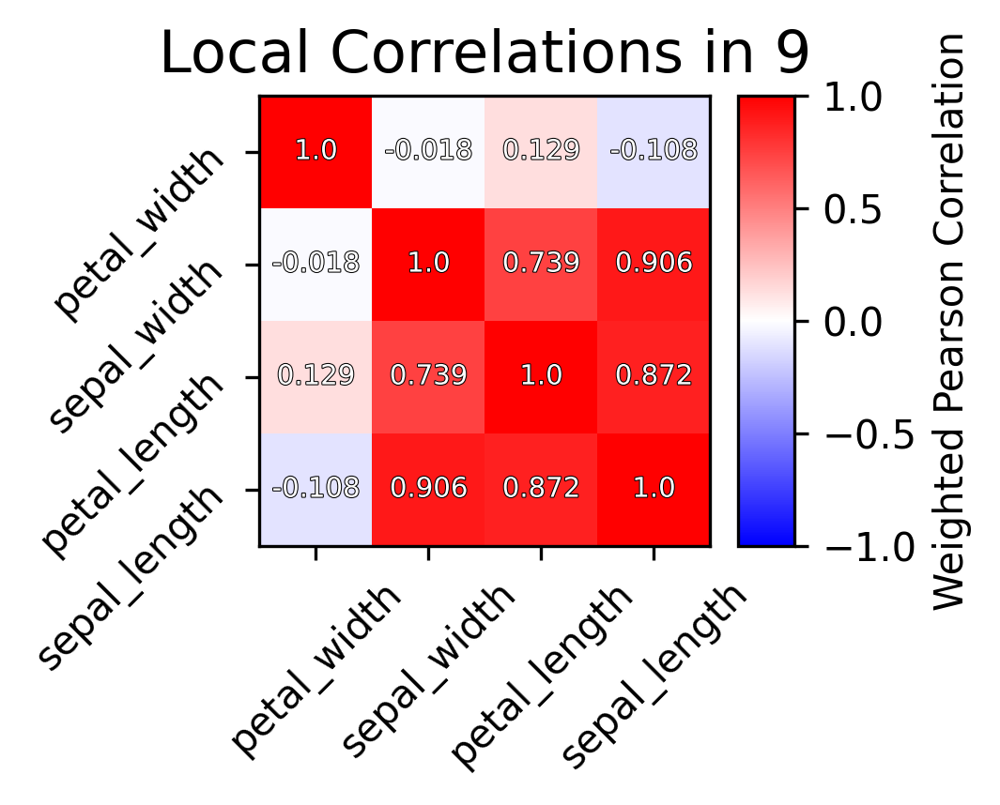

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


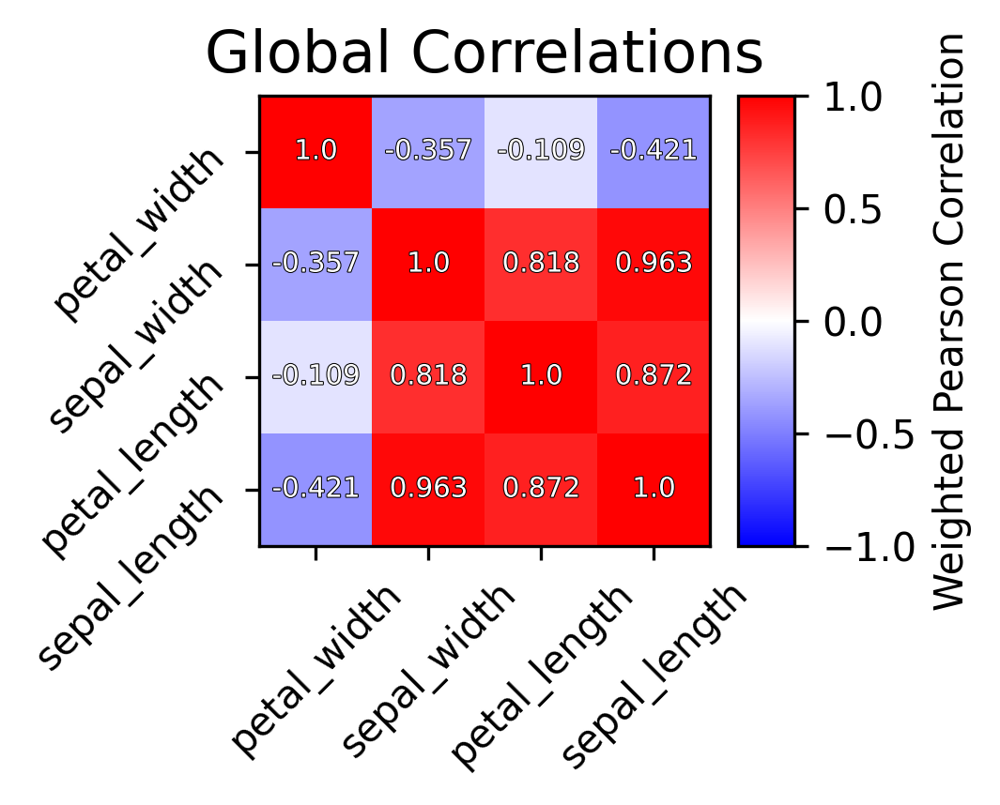

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/9/
Summarizing:10
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[11.97118243  4.55272381 47.96671387  7.86888509],A:[12.24340992  4.61073869 49.27347634  8.67144798]
Error ratio: [0.97944431 0.98966003 0.97400692 0.9170173 ]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


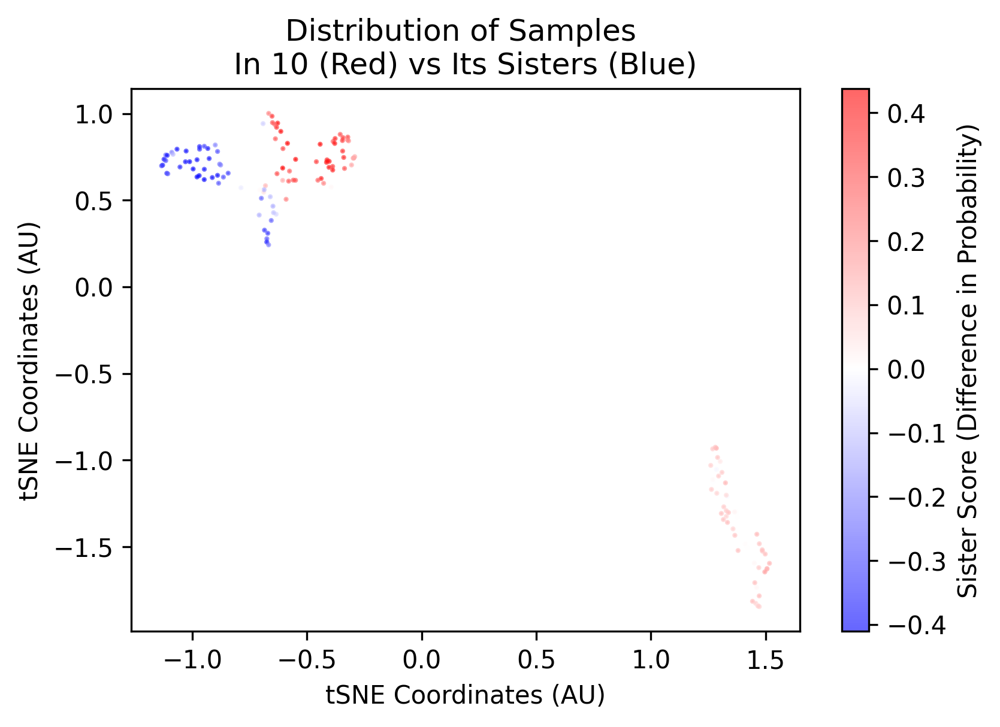

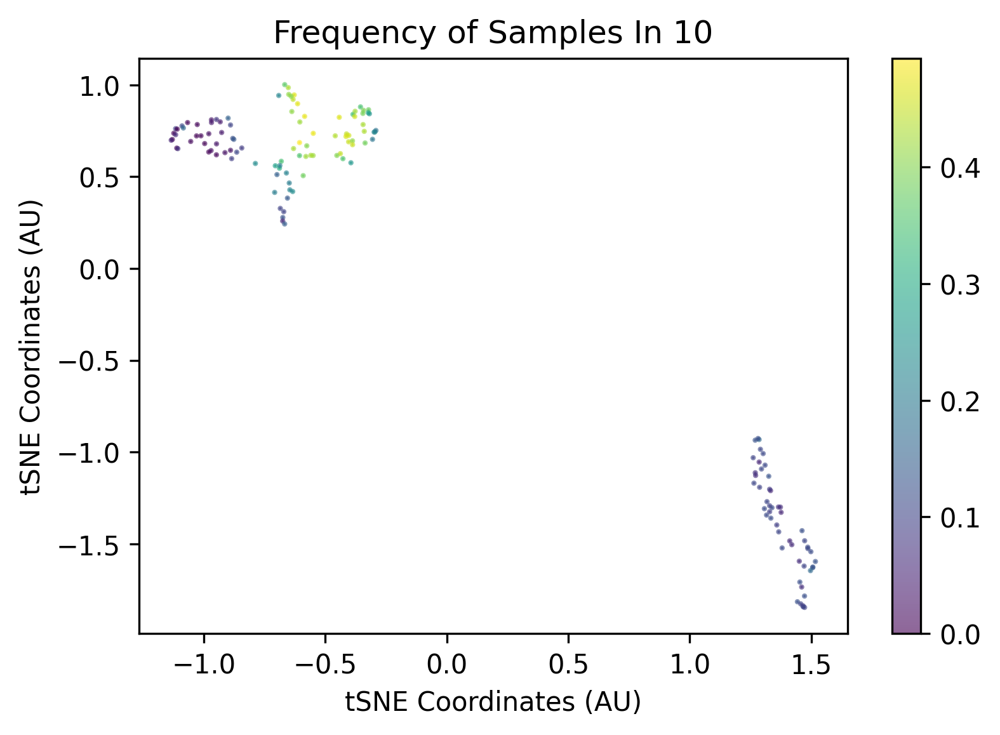

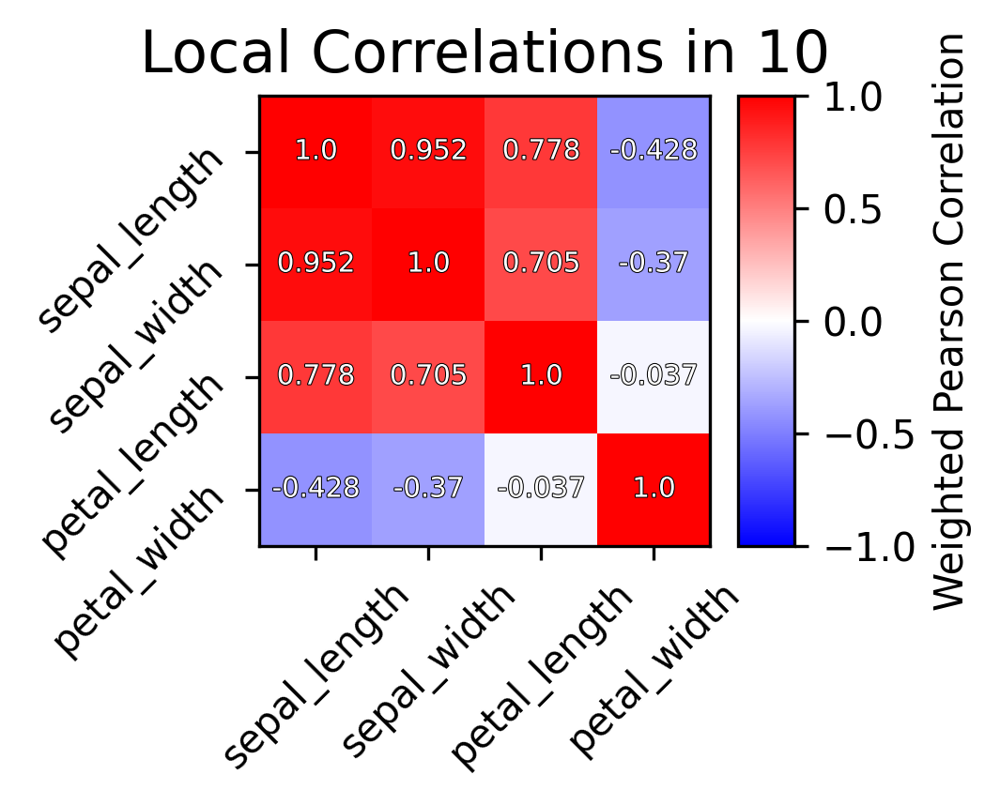

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


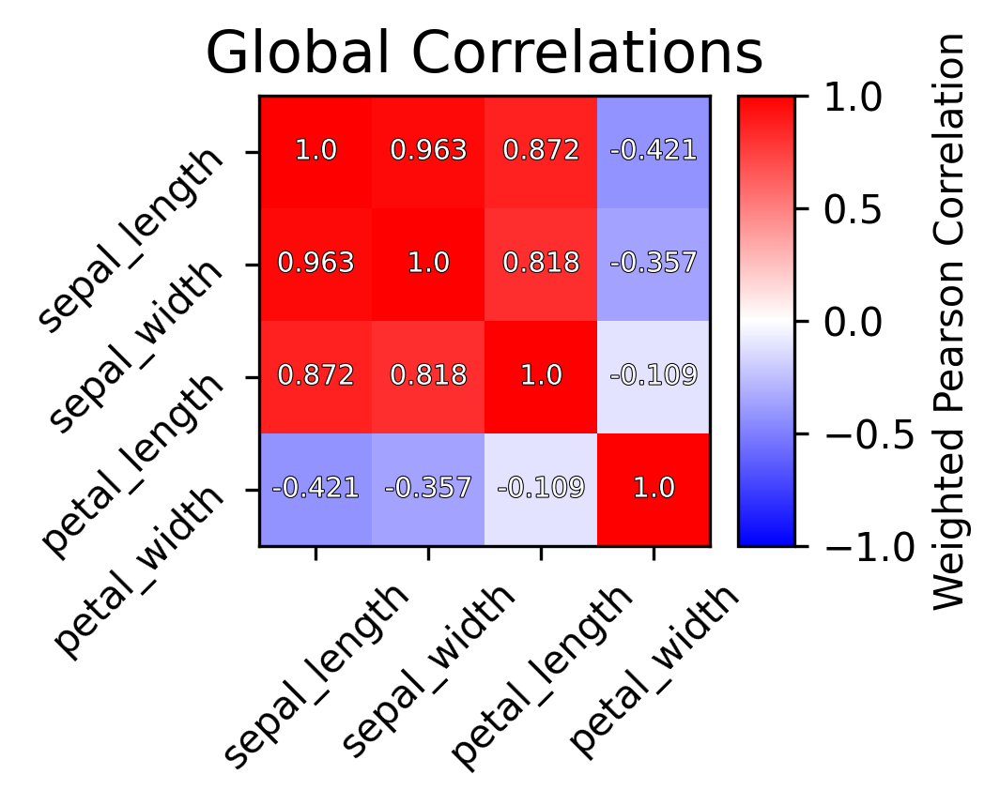

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/10/
Summarizing:11
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Error: P:[18.38450824  4.92404413 69.77407944 12.98638993],A:[19.00510828  5.56391432 69.27133939 13.05444546]
Error ratio: [0.96897792 0.90251698 1.00715427 0.99515772]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:611: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


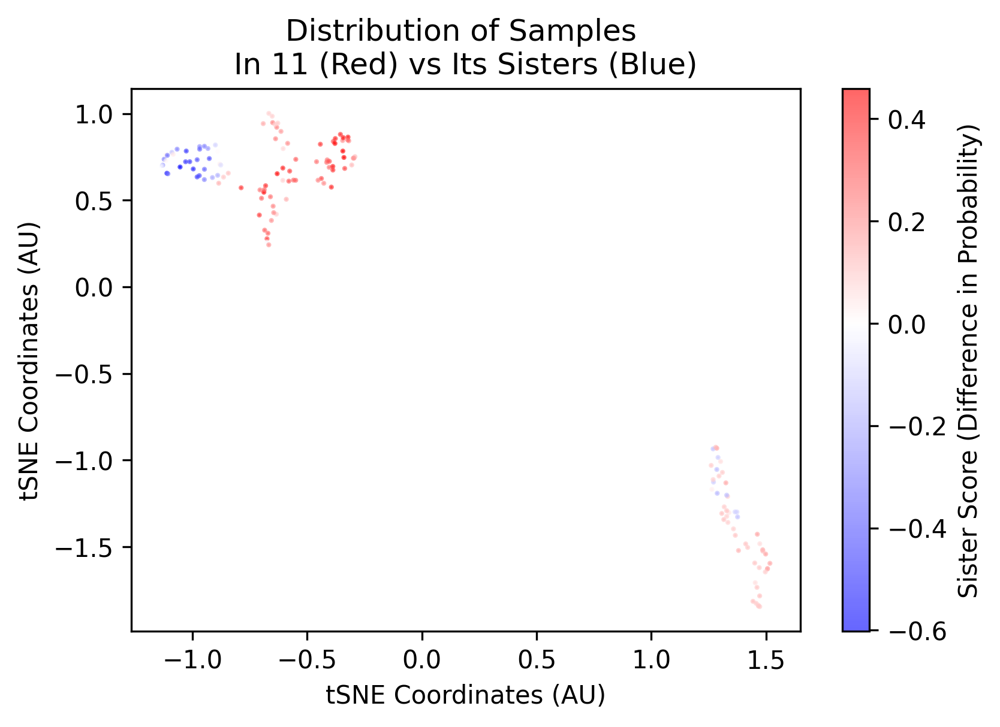

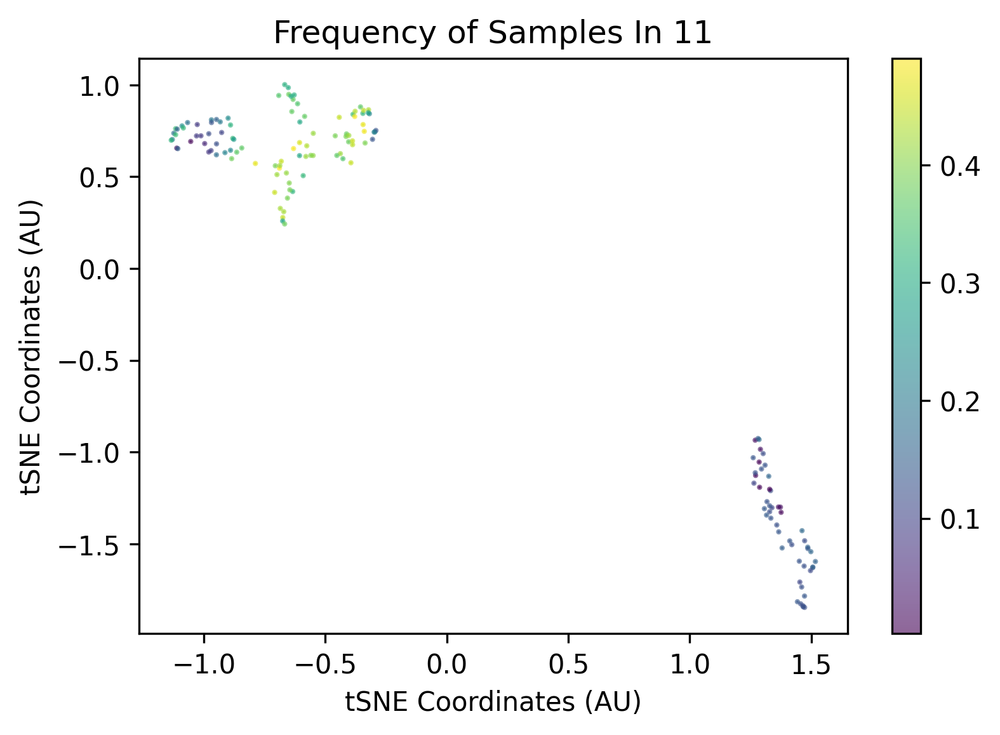

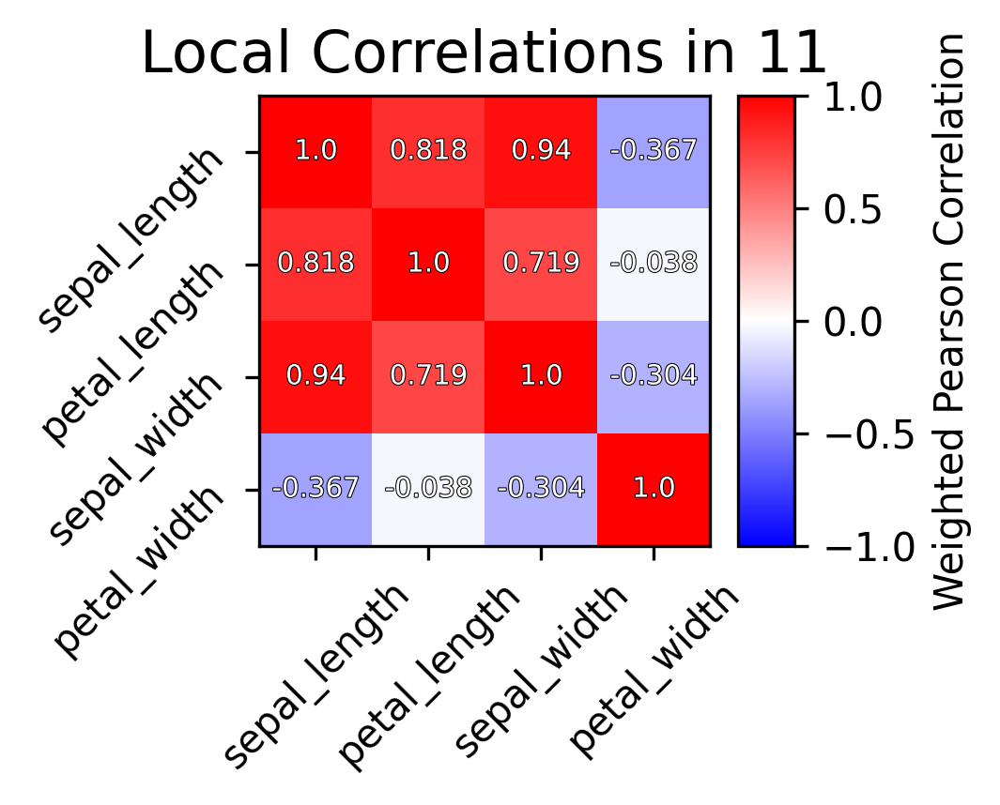

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/tree_reader_node_cluster.py:641: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


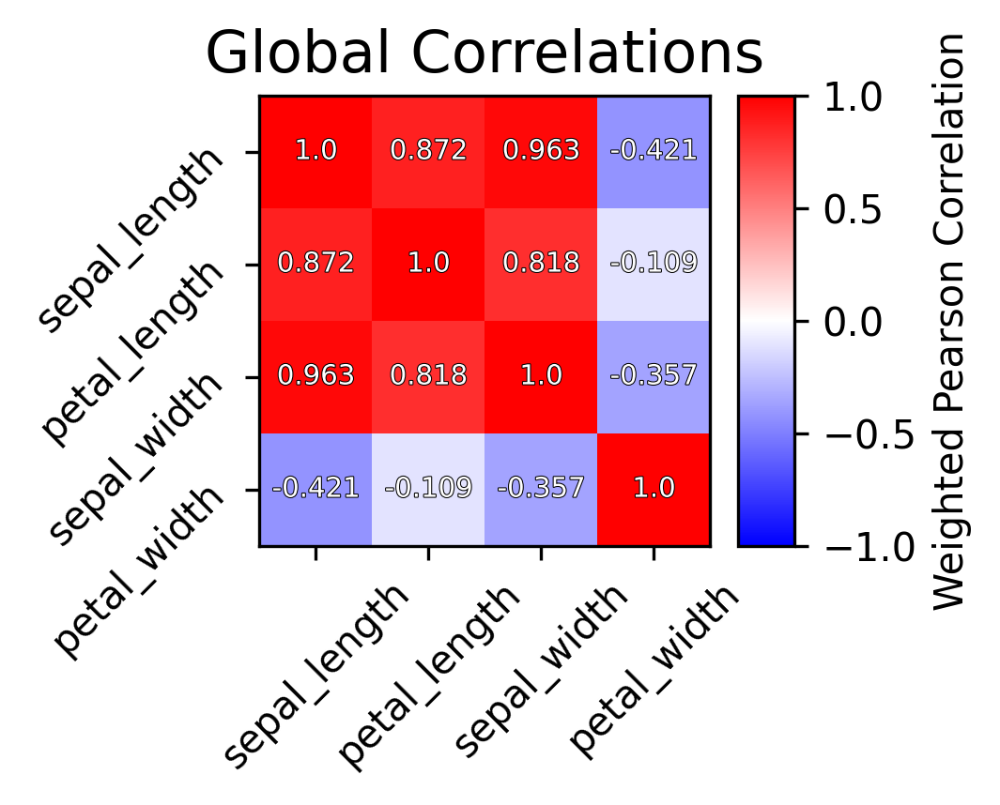

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/11/


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


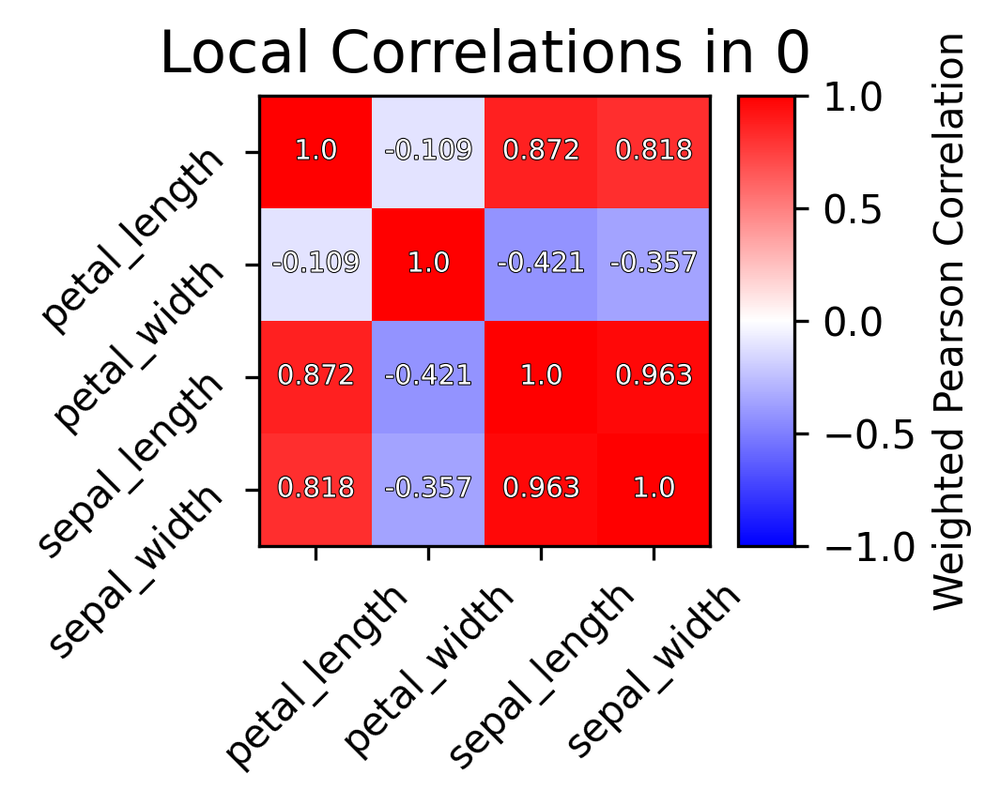

Generating top global


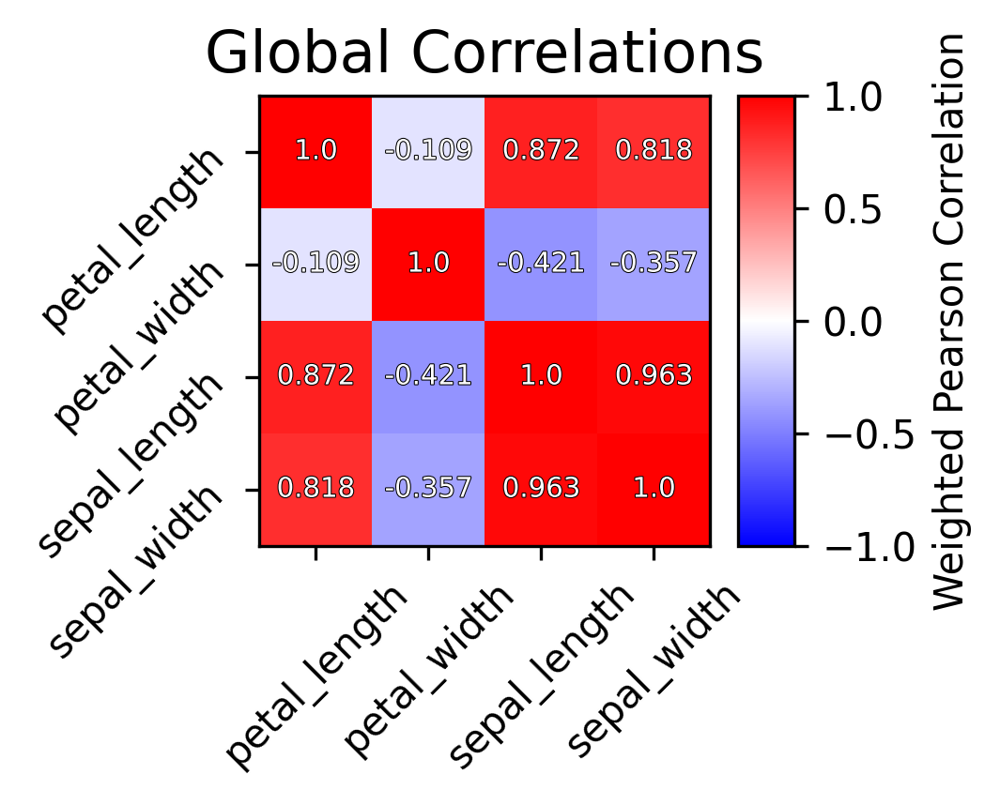

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/0/
Error: P:[16.46823311  4.43876572 91.59413995 17.17241966],A:[18.62737591  4.82877344 92.05638016 17.52008387]
Error ratio: [0.8899933  0.93308923 0.99503269 0.98122772]
Generating top local


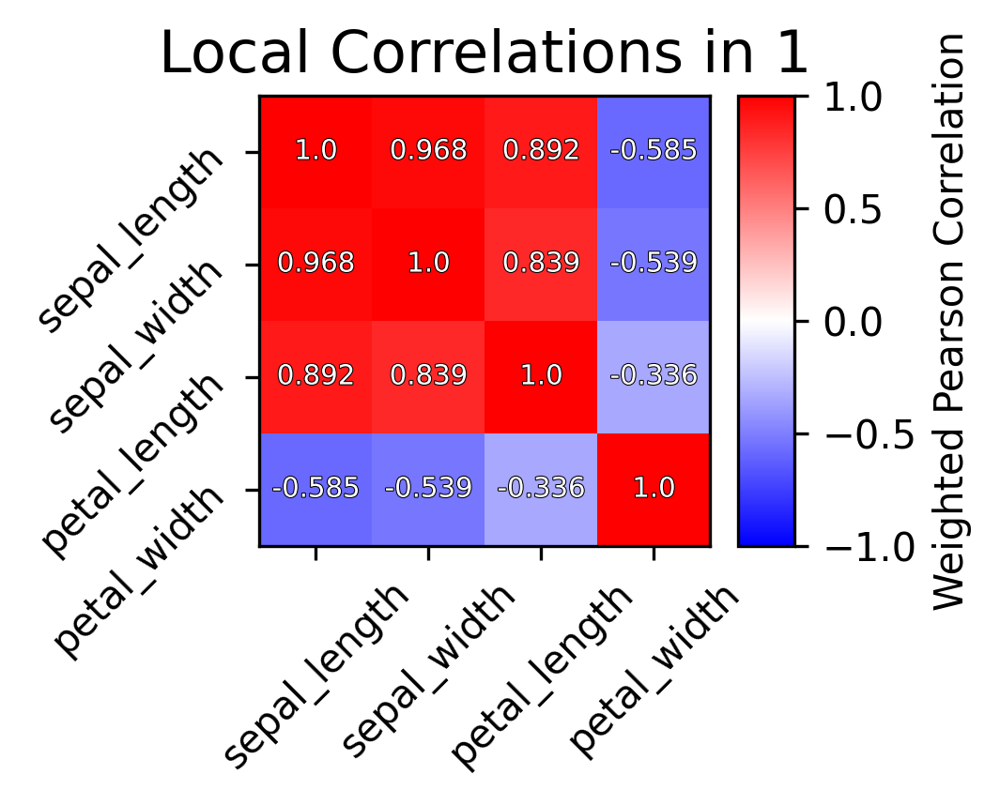

Generating top global


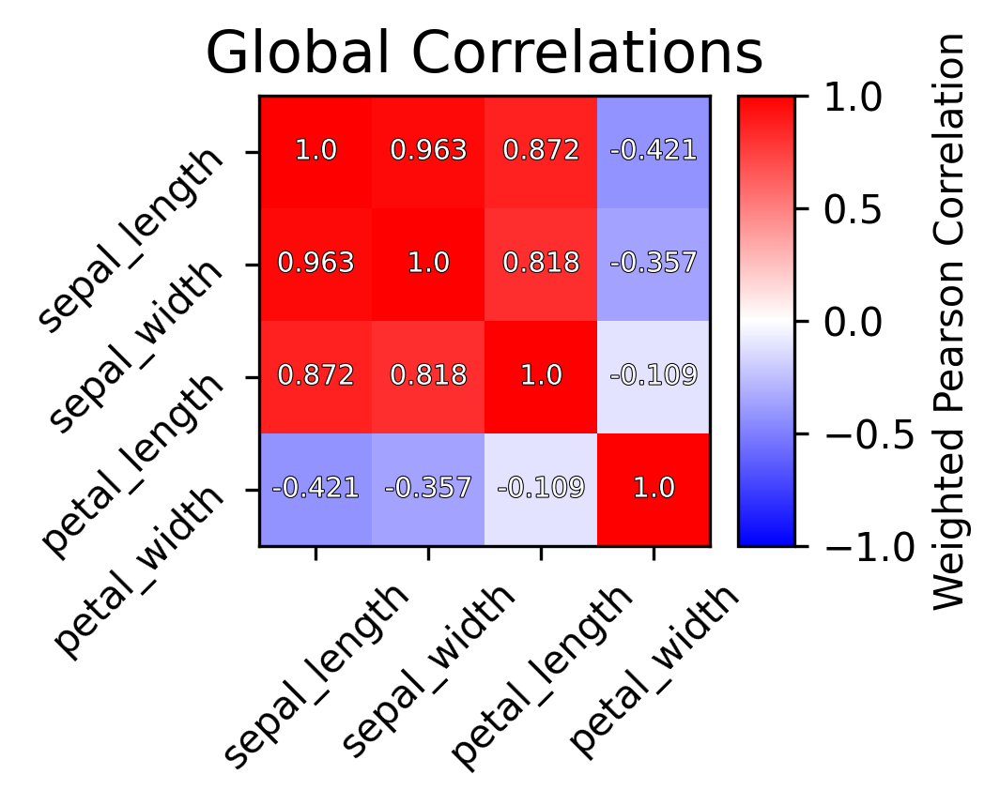

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/1/
Error: P:[12.8656887   3.02656621 31.90399395  6.91410143],A:[16.78529739  3.03605311 49.40322037 11.35912797]
Error ratio: [0.77961523 0.99764946 0.65281531 0.64034465]
Generating top local


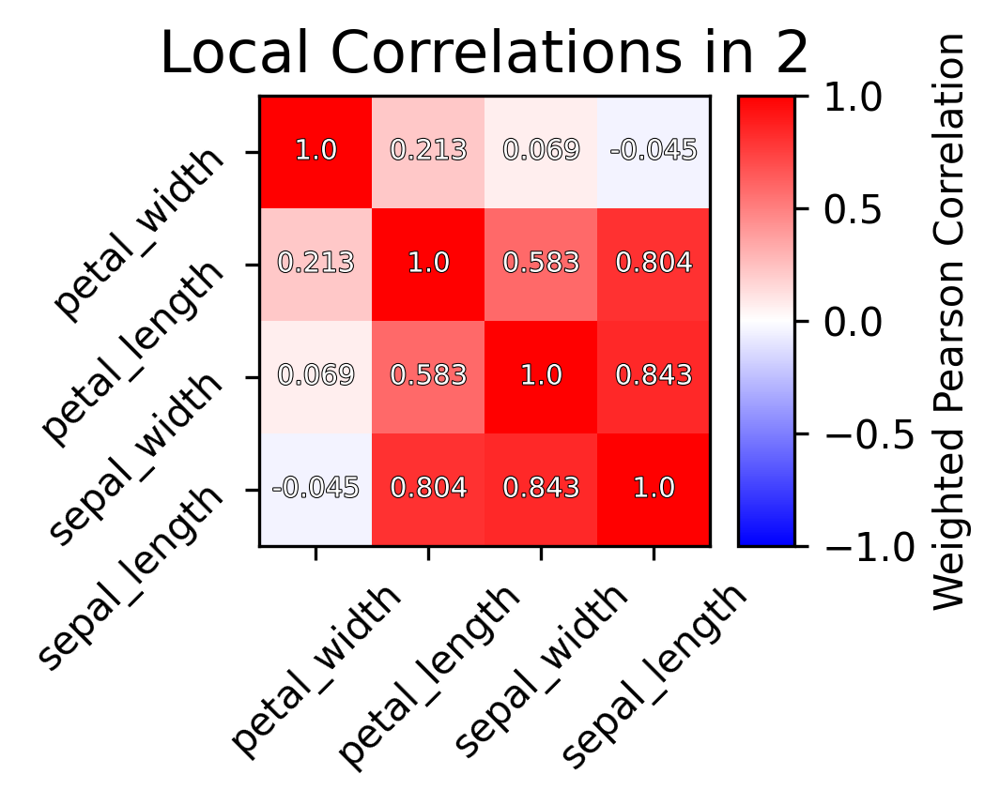

Generating top global


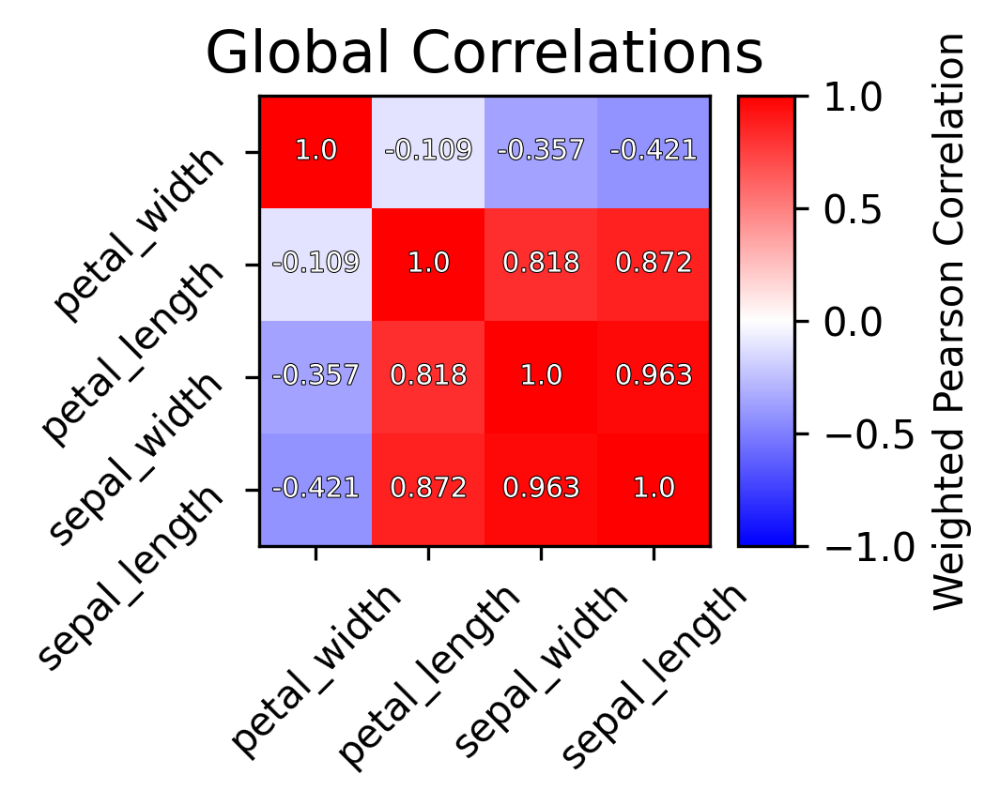

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/2/
Error: P:[10.60043865 12.24209755 58.84951364  9.97863084],A:[ 33.85739091  13.77724517 198.75920969  34.88900919]
Error ratio: [0.3327971  0.89611409 0.29960828 0.3059051 ]
Generating top local


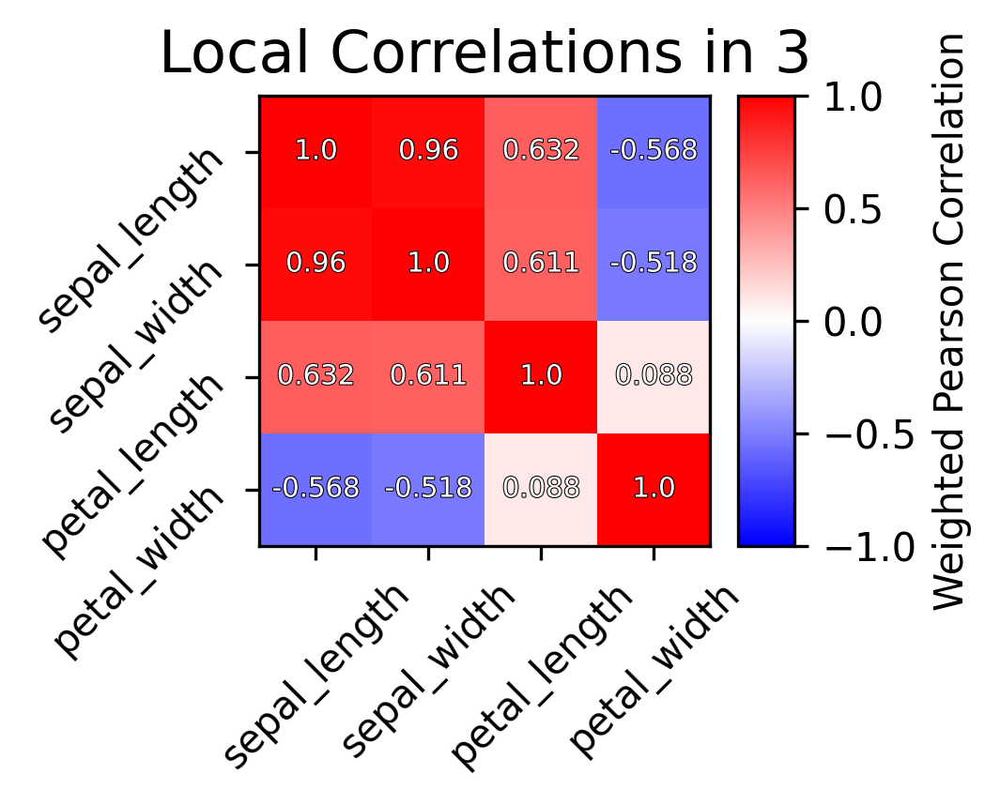

Generating top global


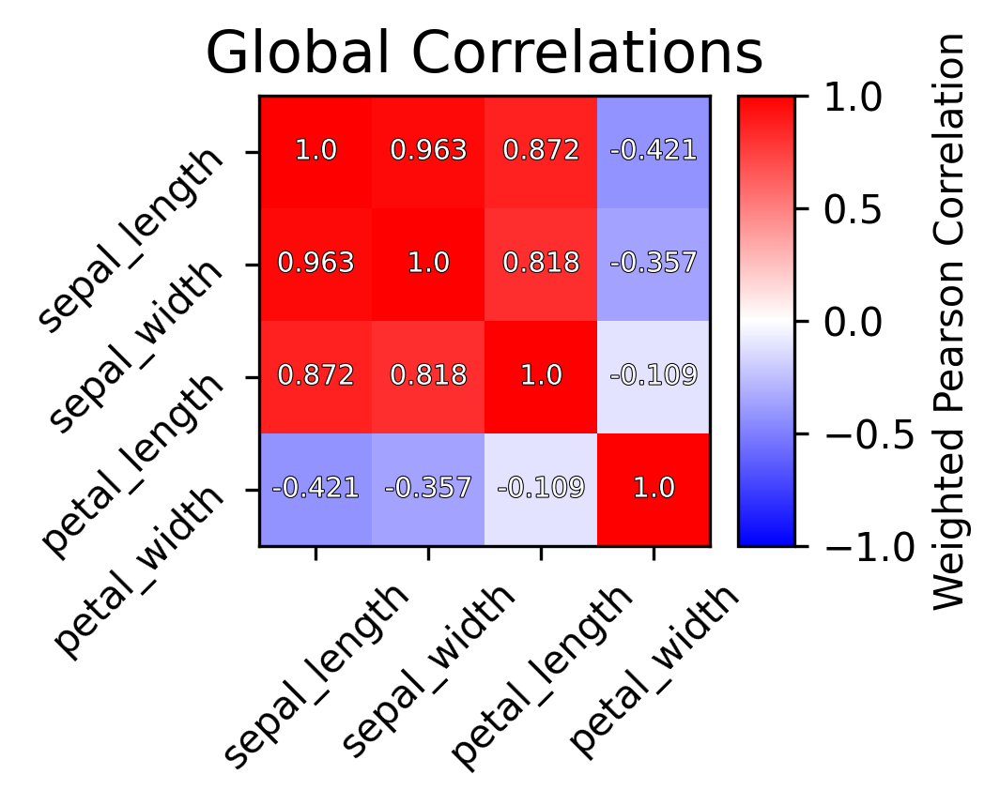

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/3/
Error: P:[29.93632723  8.29199536 54.51525881 13.96601747],A:[ 52.84294304  10.51583913 199.79413942  39.47523876]
Error ratio: [0.57456605 0.80688826 0.27647848 0.36975736]
Generating top local


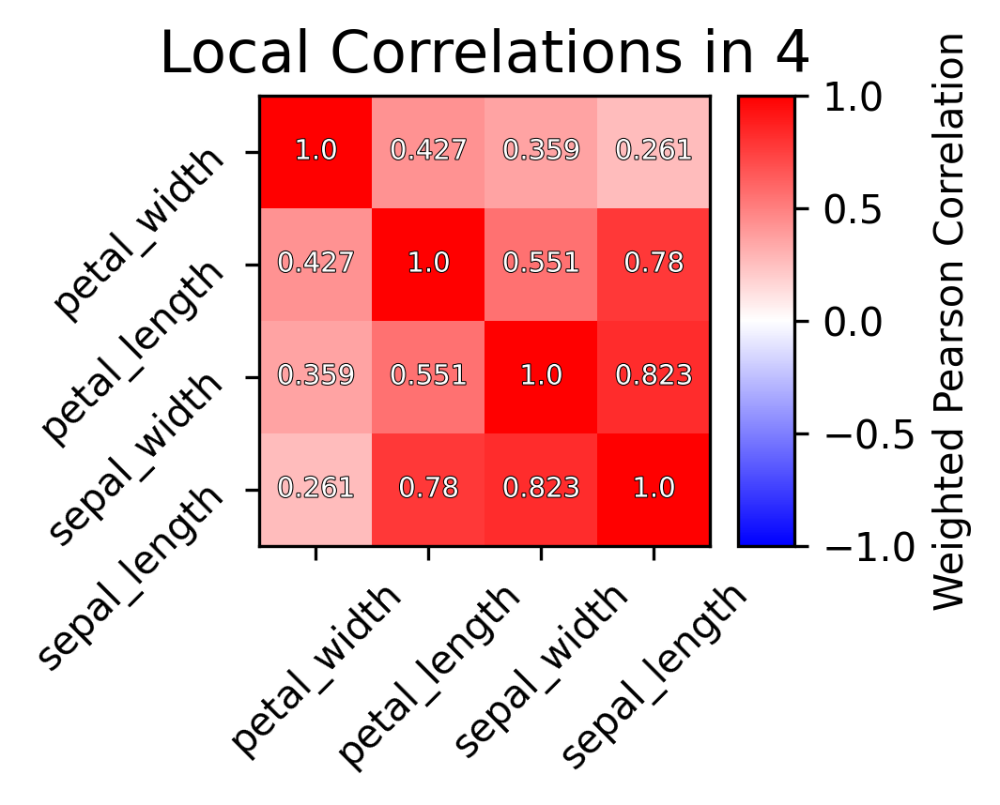

Generating top global


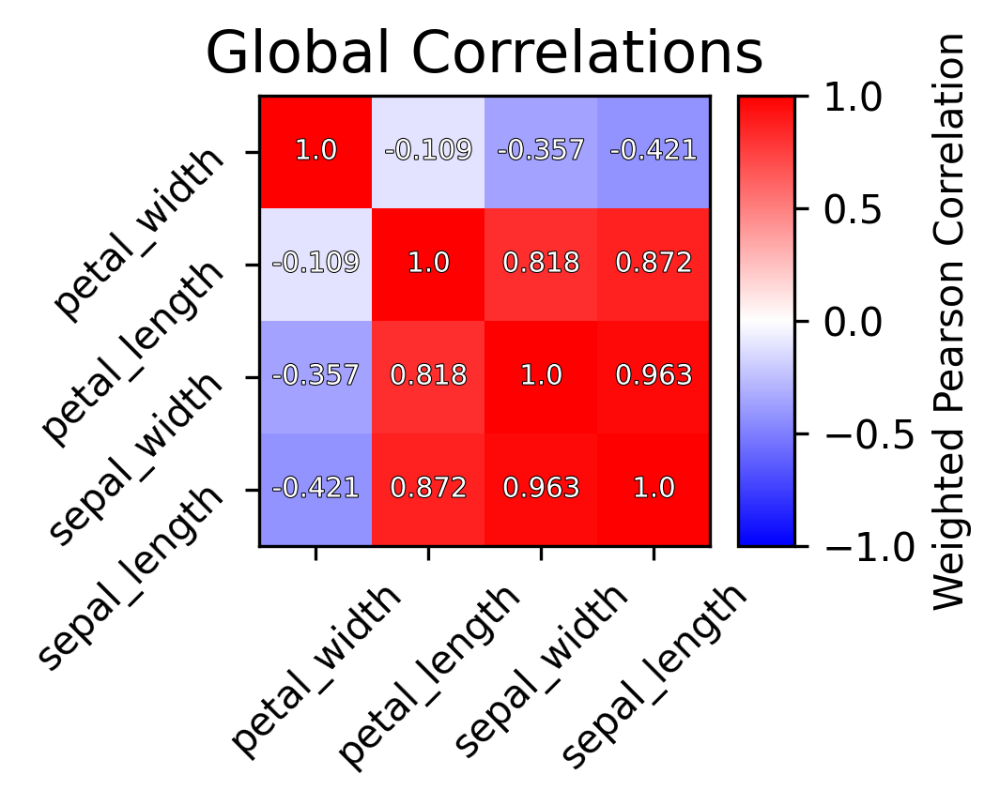

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/4/
Error: P:[ 24.36294757   4.82142174 112.86091308  20.30655799],A:[ 22.98011563   6.72680735 113.53464707  20.23903978]
Error ratio: [1.05766577 0.75340583 0.99411764 1.00317897]
Generating top local


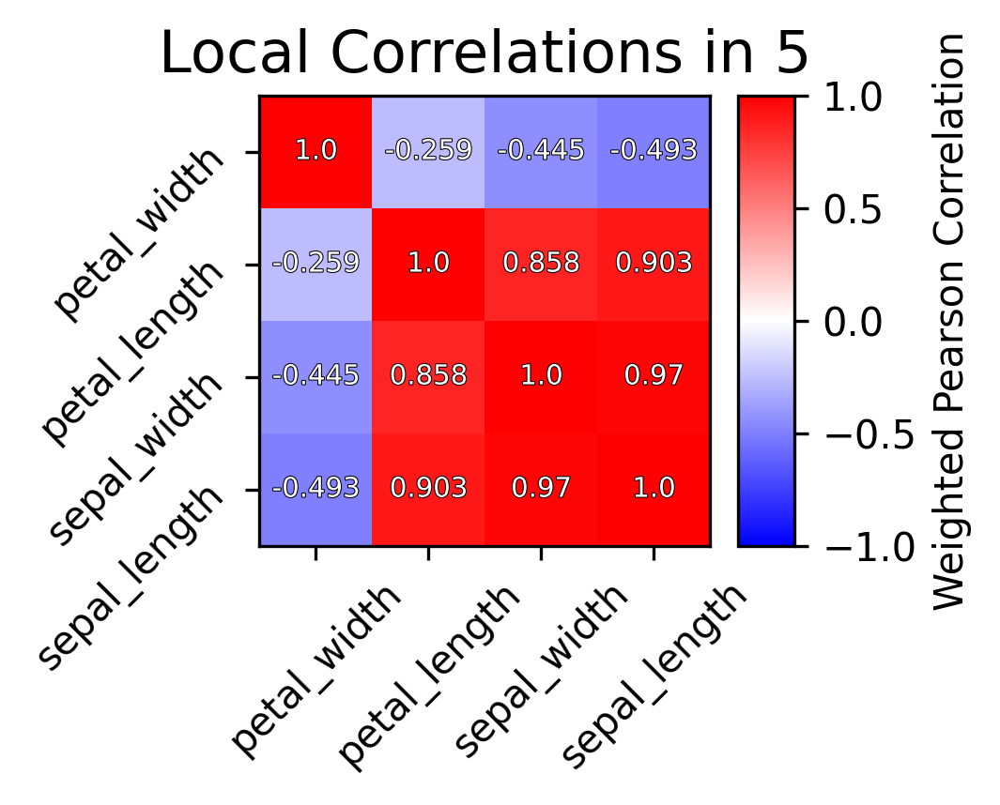

Generating top global


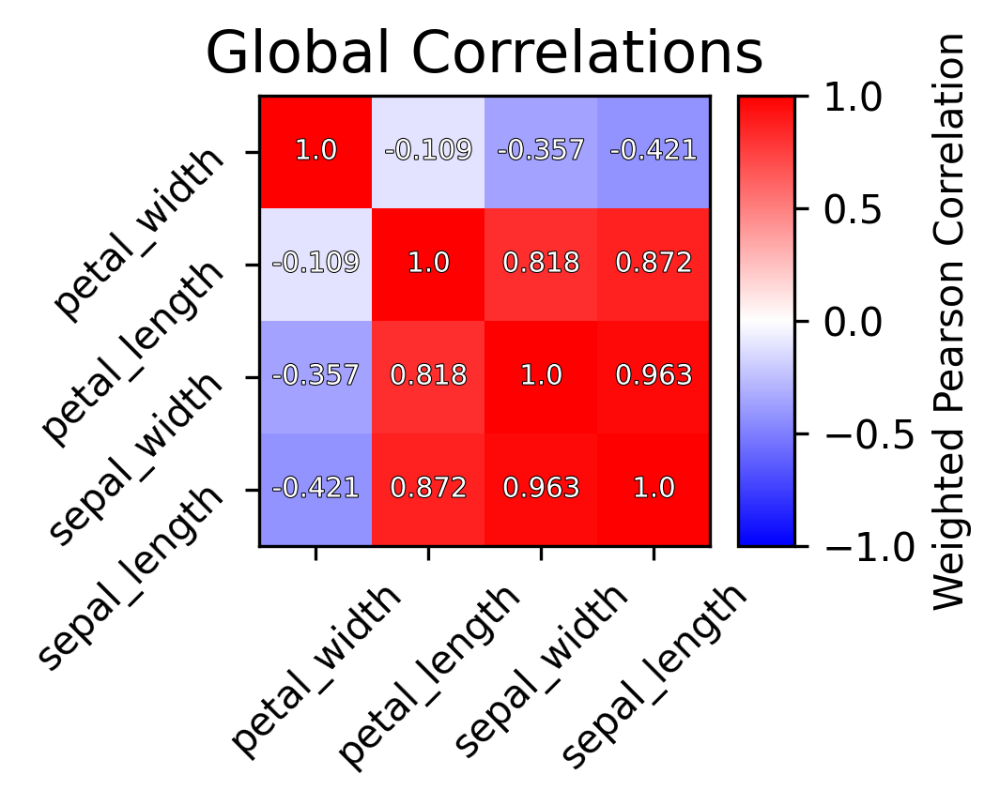

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/5/
Error: P:[4.28910429 4.66762097 6.04195445 1.23090497],A:[ 4.88233589  6.04708655 18.71609256  3.28768084]
Error ratio: [0.89915033 0.80425023 0.35716785 0.52030574]
Generating top local


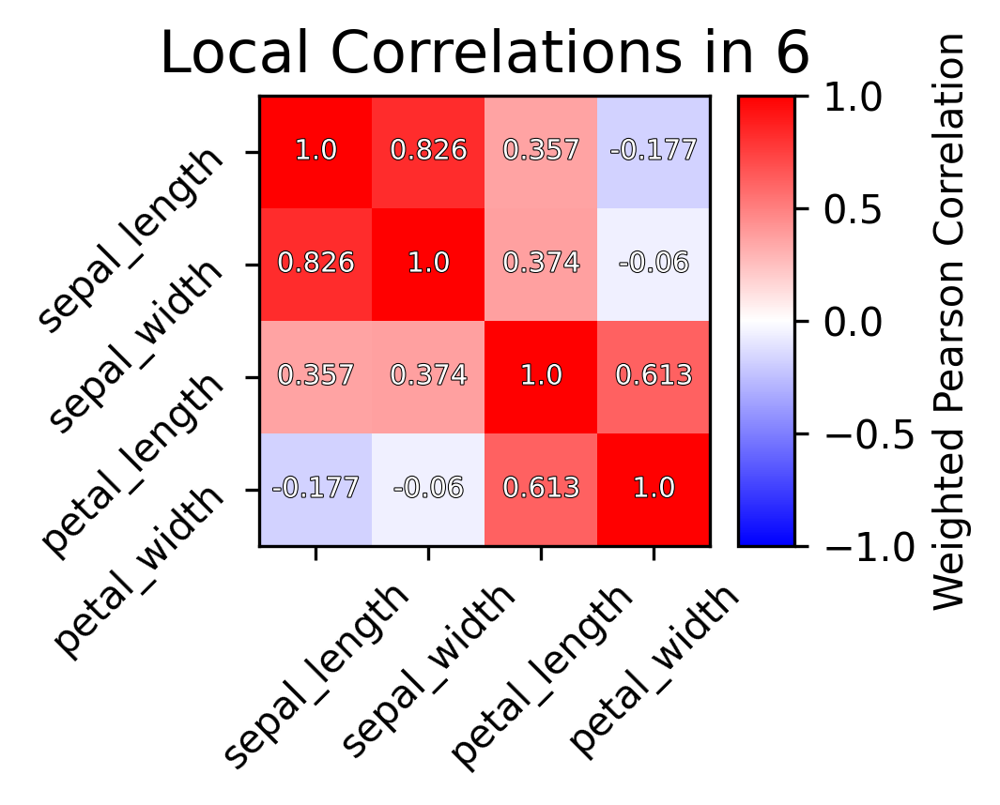

Generating top global


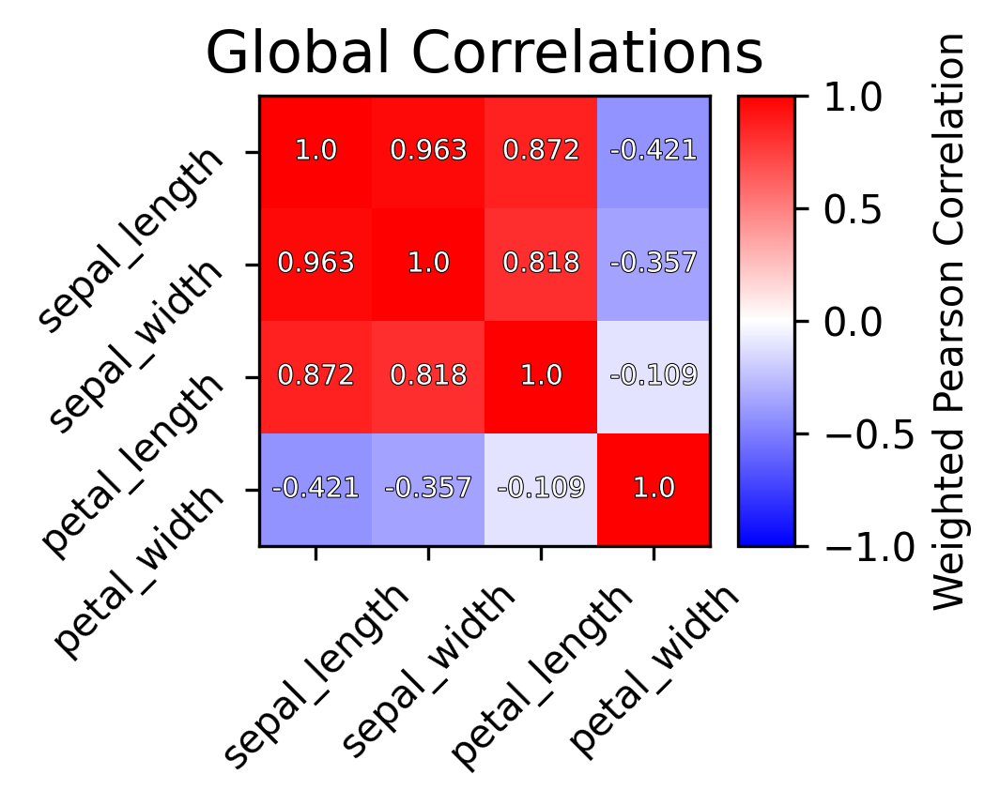

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/6/
Error: P:[12.10097753  3.62614483 47.81246305 11.21453173],A:[13.57437804  3.63577139 49.28858726 11.31455165]
Error ratio: [0.89890474 0.99792342 0.97064693 0.99187791]
Generating top local


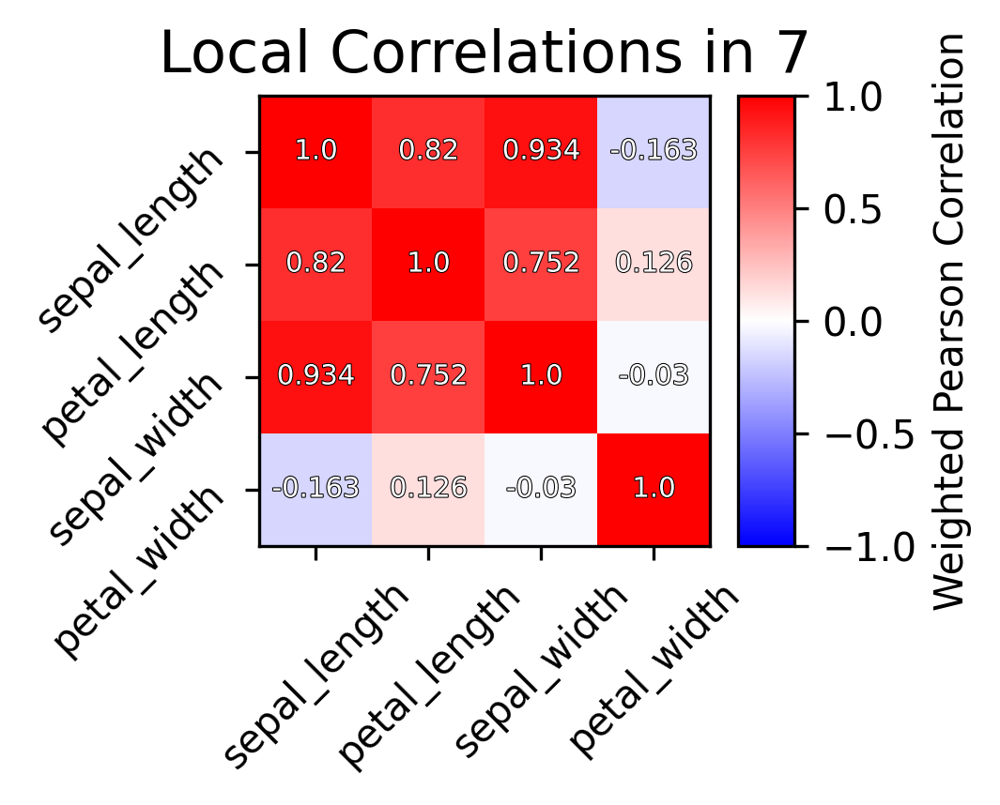

Generating top global


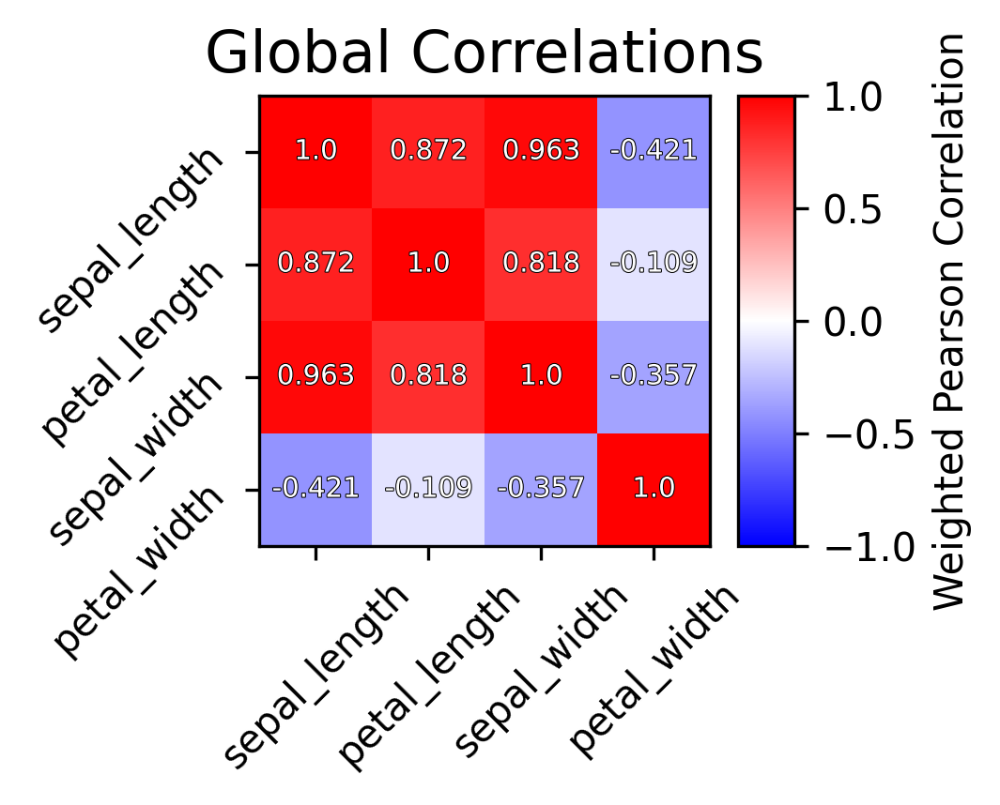

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/7/
Error: P:[ 5.77488933  1.85005645 16.63811059  3.08138425],A:[ 6.93344247  4.34996671 46.8501479   8.11240107]
Error ratio: [0.8539659  0.53272415 0.36861141 0.4478934 ]
Generating top local


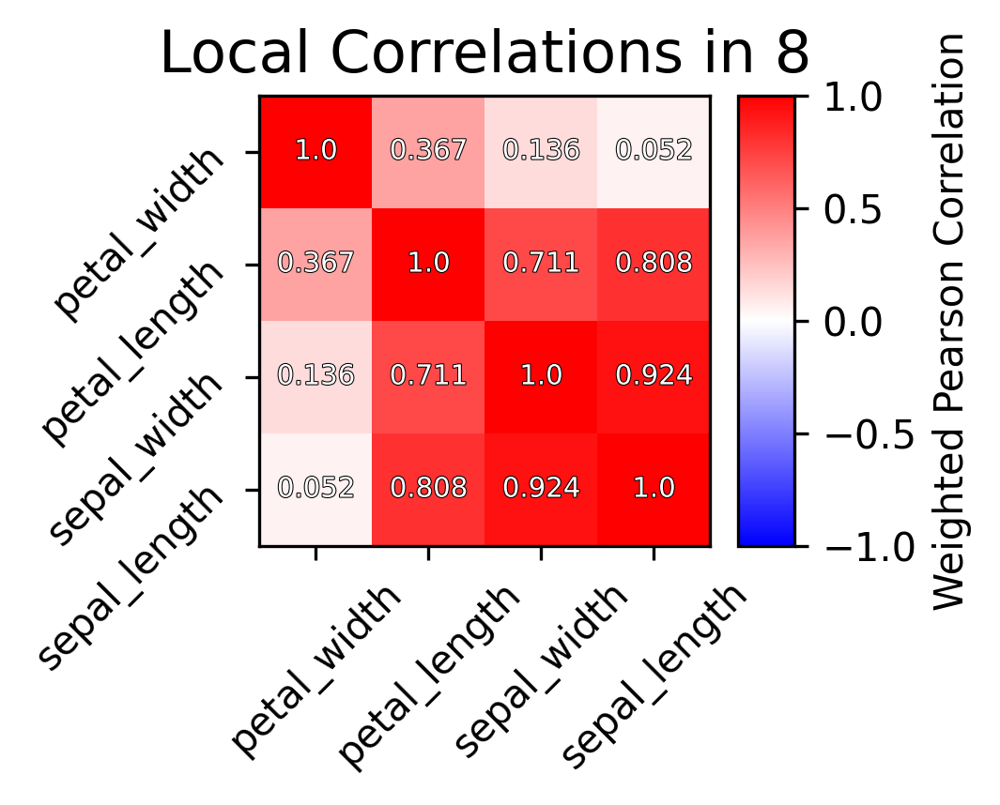

Generating top global


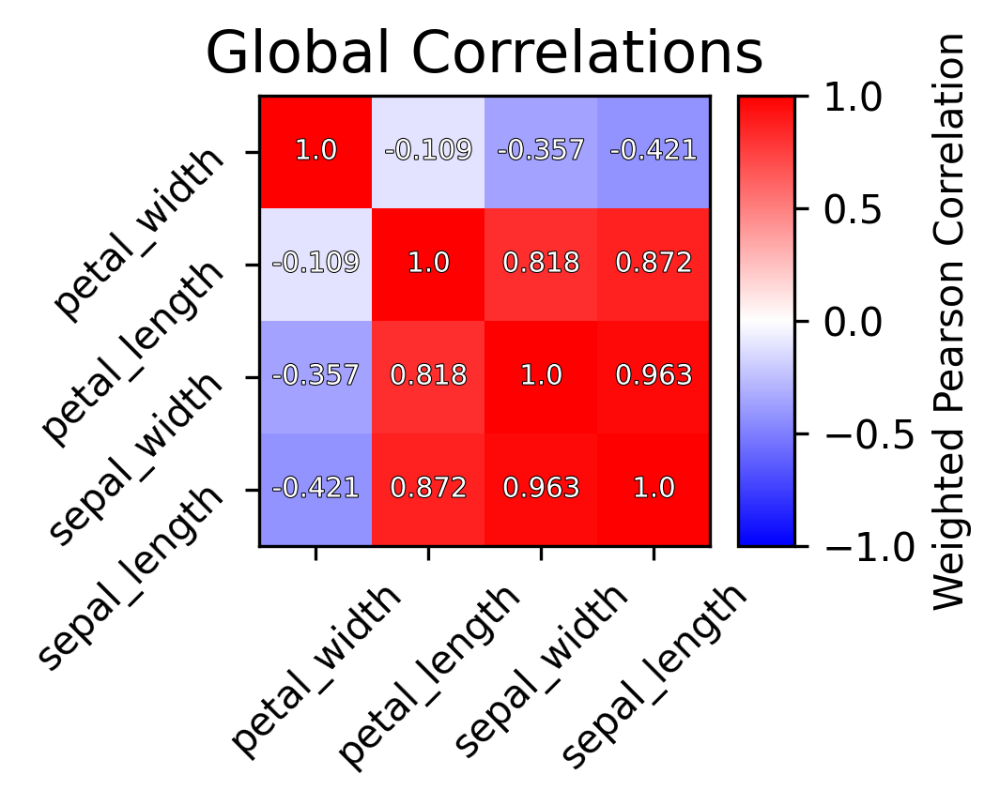

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/8/
Error: P:[10.04846794  2.50620168 30.3863337   5.44414887],A:[12.42675449  2.56851414 32.96141375  5.62965642]
Error ratio: [0.82286959 0.98253826 0.9241763  0.97201853]
Generating top local


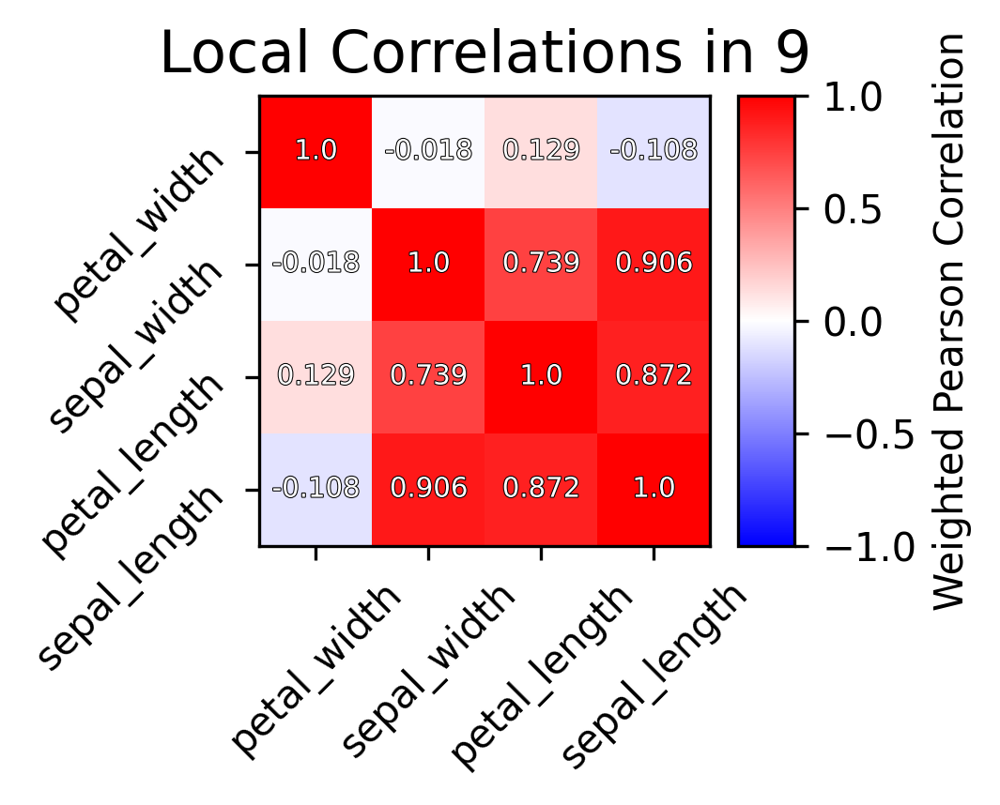

Generating top global


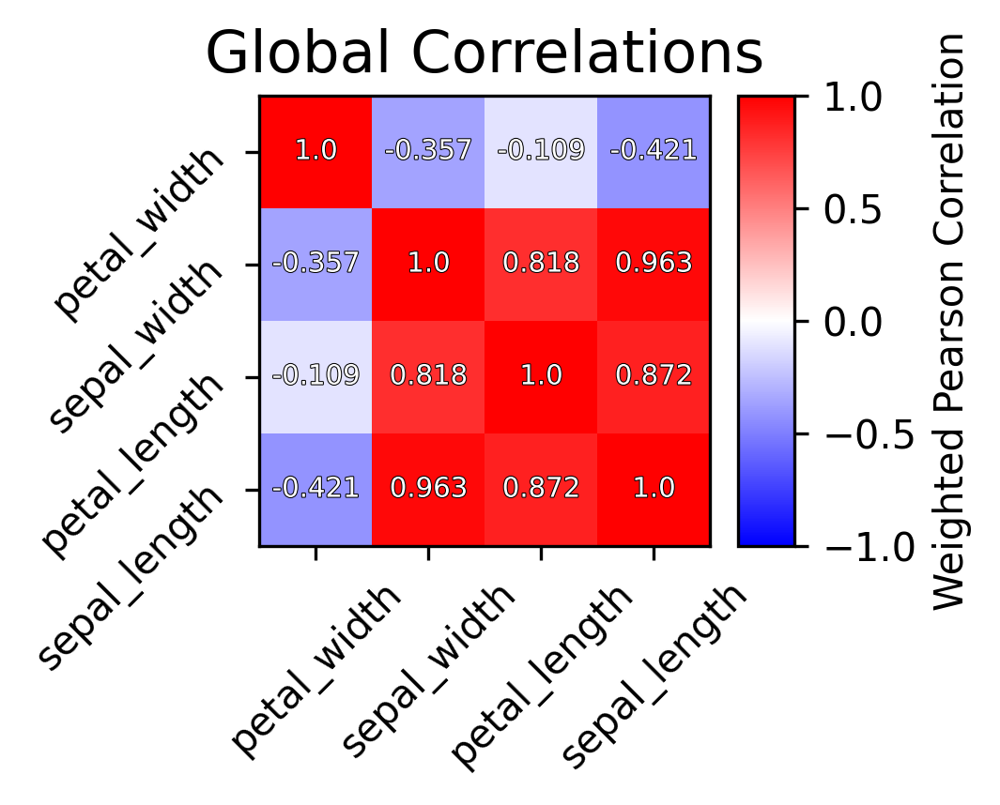

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/9/
Error: P:[11.97118243  4.55272381 47.96671387  7.86888509],A:[12.24340992  4.61073869 49.27347634  8.67144798]
Error ratio: [0.97944431 0.98966003 0.97400692 0.9170173 ]
Generating top local


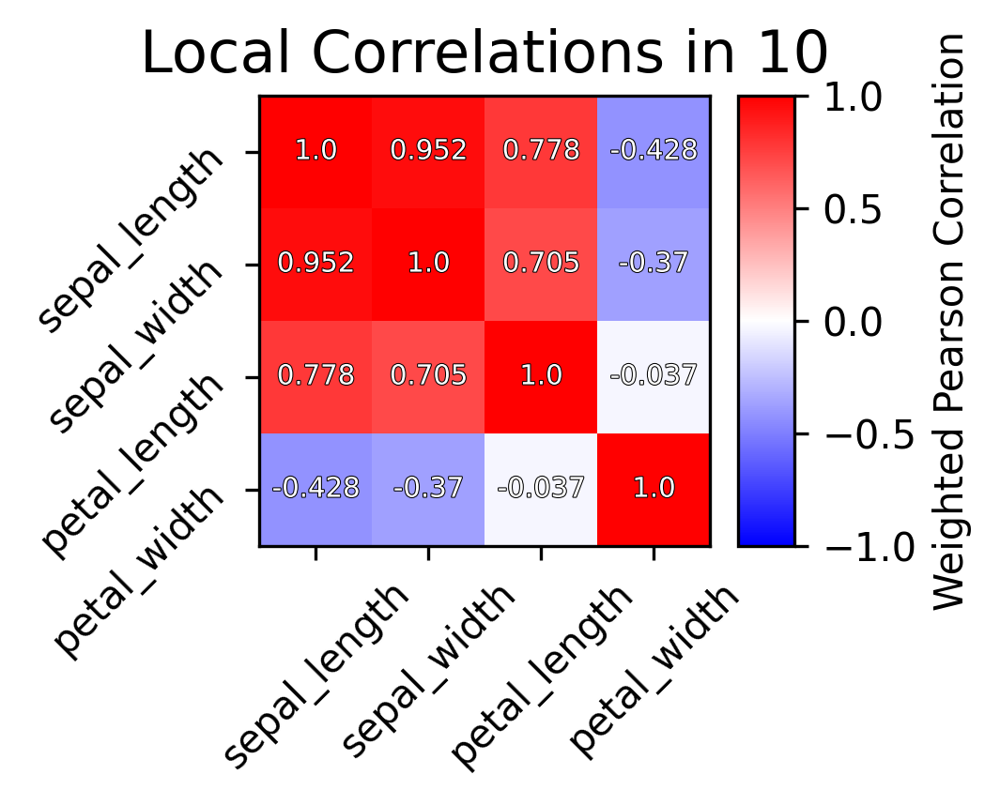

Generating top global


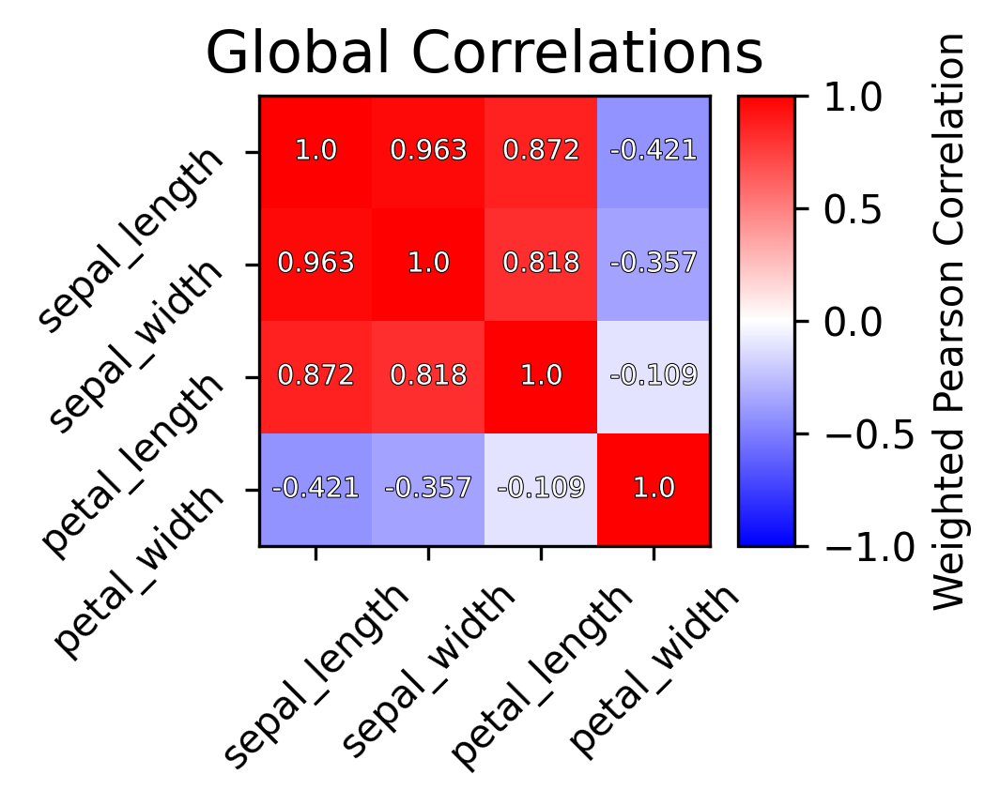

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/10/
Error: P:[18.38450824  4.92404413 69.77407944 12.98638993],A:[19.00510828  5.56391432 69.27133939 13.05444546]
Error ratio: [0.96897792 0.90251698 1.00715427 0.99515772]
Generating top local


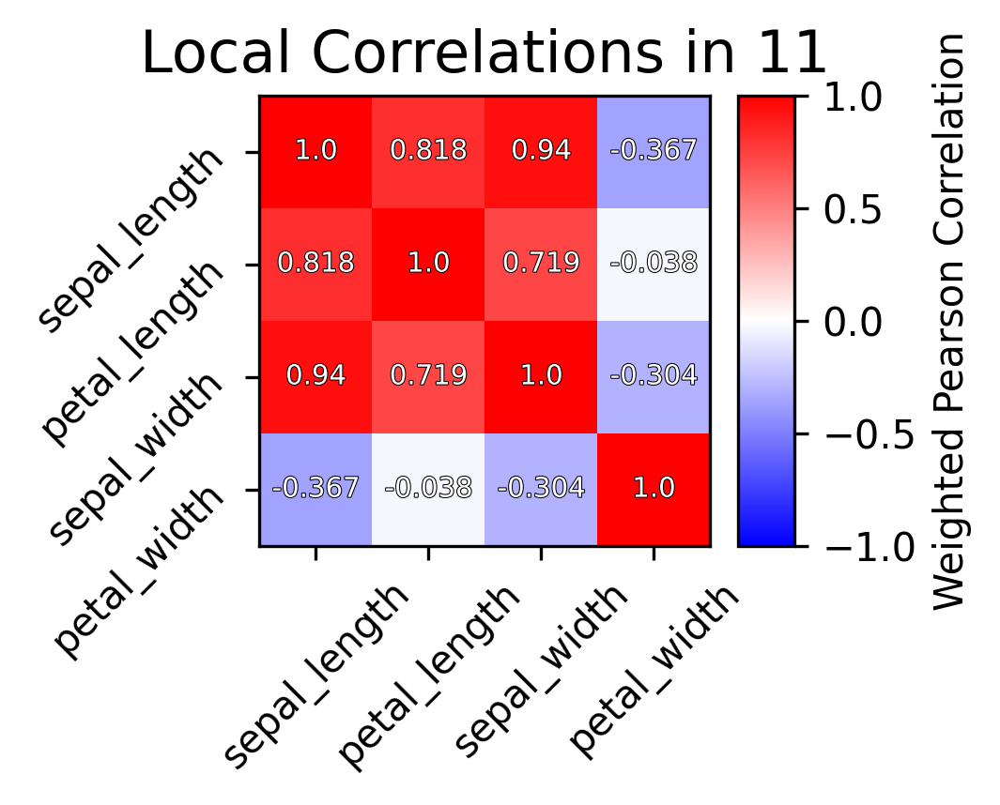

Generating top global


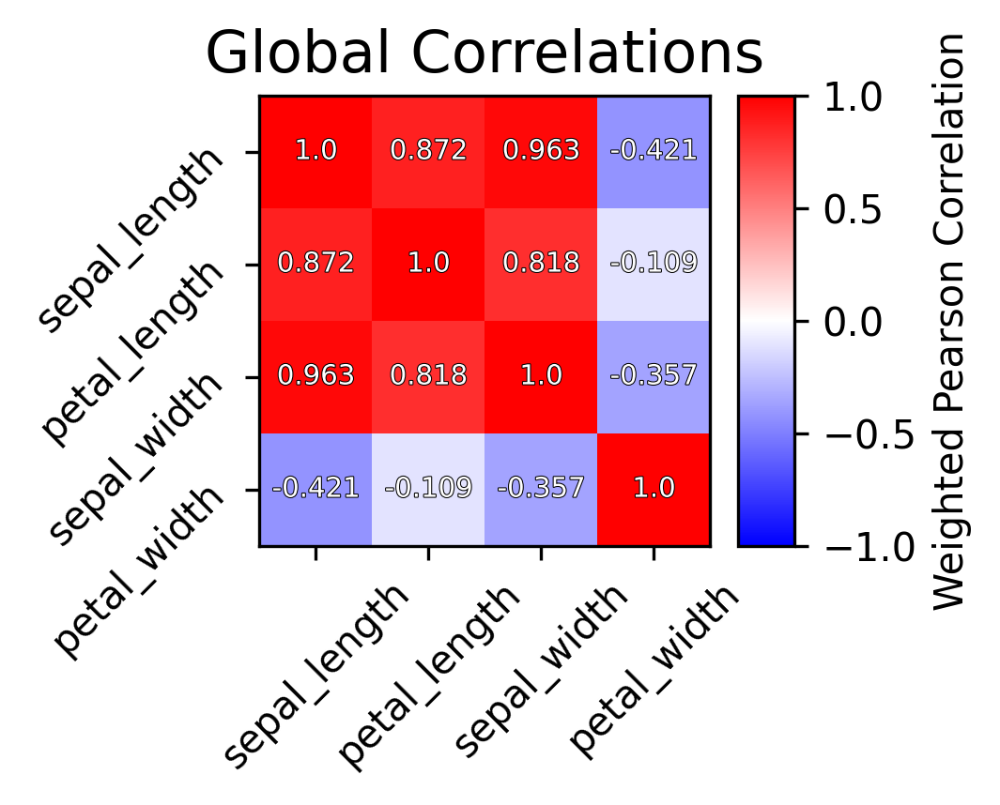

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/11/


In [8]:
forest.html_tree_summary(
    
    n=2,
    # This parameter controls how many features are used when summarizing particular nodes. 
    
    output=None
    # If you would like your HTML report to be saved to a particular location, put it here. 
    # BE WARNED, anything currently at that location WILL be deleted, so don't point this option at a populated
    # directory. 
)

What happened here?

We have clustered the nodes of the RFR into groups based on the effects they predict in their children. Each group of nodes is called a "factor" because similarly to factors used in factor analysis, they summarize the behavior of several observed variables that tend to move together in some way. Like other factors, RF factors produce certain "scores" for each sample, reflecting the likelihood that an effect predicted by the factor "applies" to a particular sample.

Factors can also give "sister scores" 

After you've looked at the consensus tree, you may want to start annotating the individual clusters.

For example, let's sort the clusters by sepal length, and call the cluster that predicts the most negative partial effect for sepal length as probably describing Iris Setosa vs all others. 

In [9]:
# We will obtain a matrix of the average partial values for each factor for a set of features

petal_partials = forest.factor_partial_matrix(
    features = ['sepal_length','sepal_width']
    # For datasets with (too) many features it is possible to compute partials and gains only for some features
    # Or leave this option blank to get the partials for all features in the order they are in your header
)

setosa_factor = forest.factors[np.argsort(petal_partials[:,0])[0]]

setosa_factor.set_name("Setosa")

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:174: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:191: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


[('petal_length', -0.6149028876776609), ('petal_width', 0.20293048352327625), ('sepal_length', -0.7373018977902555), ('sepal_width', -0.696152019077524)]


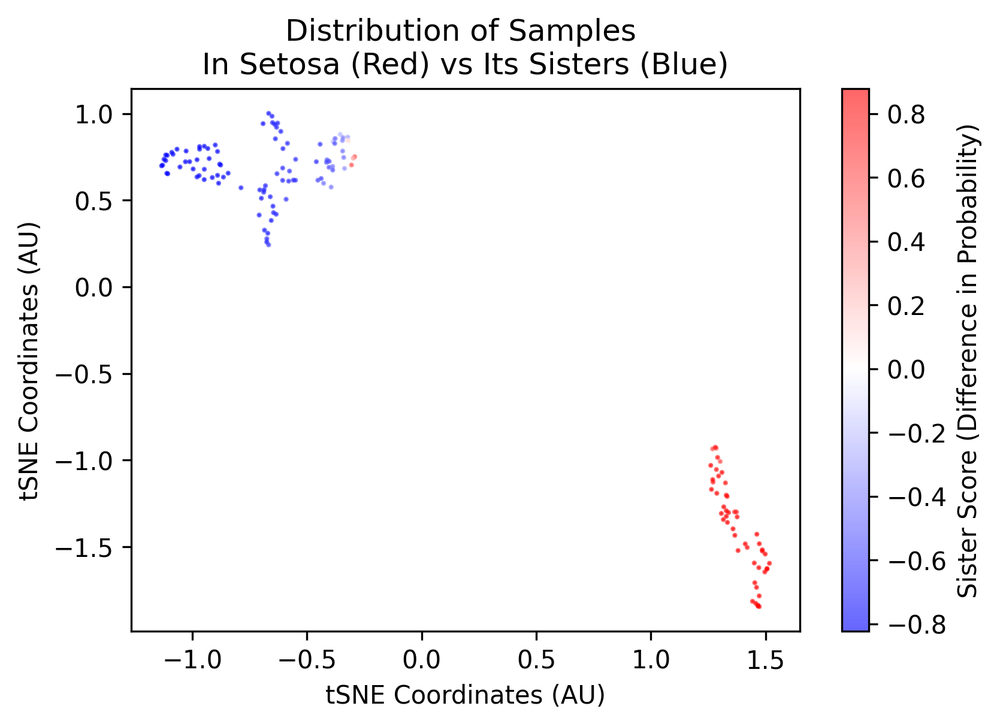

In [10]:
# Now let's look at the setosa factor in more detail.

# We can plot the distribution of its sister scores on our UMAP
_ = setosa_factor.plot_sister_scores()

# Or we can look at other features that are highly explained by this factor
# Let's leave the features field blank and look at the partials for everything:
setosa_partials = setosa_factor.feature_partials()

print(list(zip(forest.output_features,setosa_partials)))

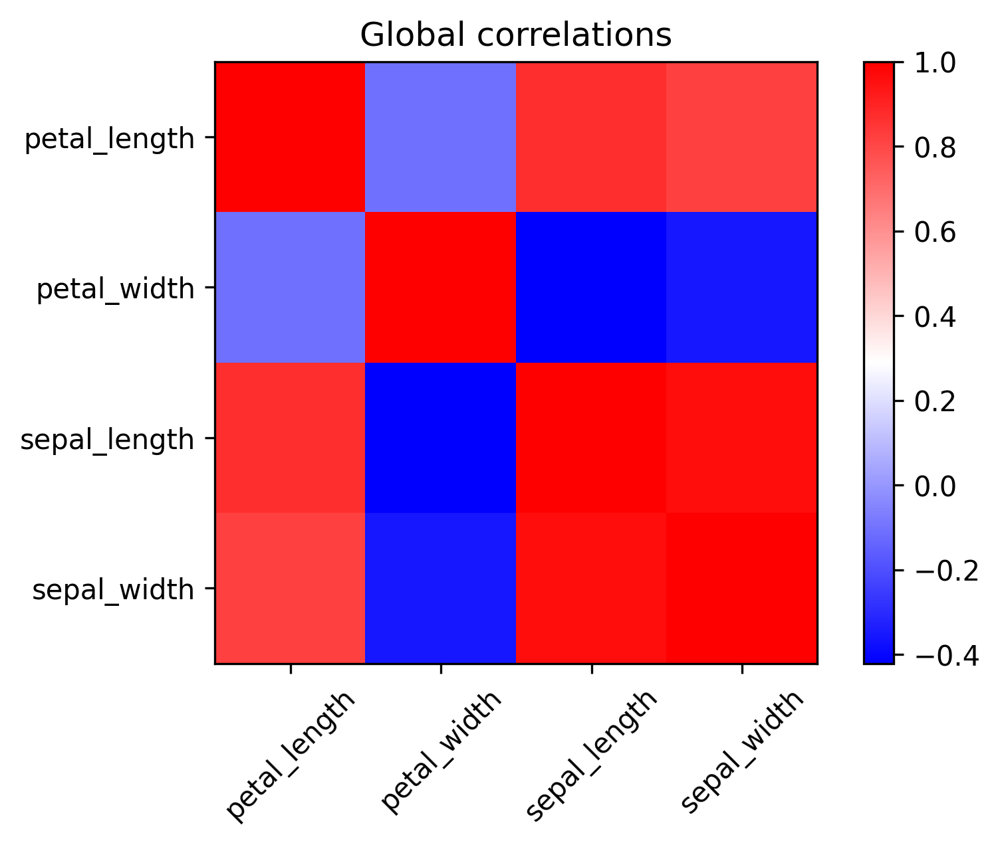

In [11]:
# We also see a large partial effect for sepal width. It seems like these two traits may be correlated. 
# Is that true globally?

g_corr = forest.global_correlations()

plt.figure()
plt.title("Global correlations")
plt.imshow(g_corr,cmap='bwr')
plt.xticks(np.arange(4),forest.output_features,rotation=45)
plt.yticks(np.arange(4),forest.output_features)
plt.colorbar()
plt.show()

In [12]:
# Hmm. Seems so! Let's check if there are any features that have a strange local behavior.

# by the way, you should generally ignore the behavior of the root factor, it's sort of special 
# due to not having parents.
for factor in forest.factors:
    
    # We are going to check to compare the difference between local and global 
    # correlations for all features in every factor and see any extreme values
    # show up
    
    delta = (forest.global_correlations() - factor.local_correlations()).flatten()

    print(factor.name())
    print(sorted(delta)[:3])
    print(sorted(delta)[-3:])

0
[-3.885780586188048e-16, -3.3306690738754696e-16, -1.1102230246251565e-16]
[6.106226635438361e-16, 6.661338147750939e-16, 6.661338147750939e-16]
1
[-0.020740675682366372, -0.02074067568236626, -0.020701149947137565]
[0.18216651594736522, 0.22709922595499912, 0.22709922595499912]
2
[-0.42516421498479495, -0.4251642149847949, -0.3755320486760615]
[0.1197495767525657, 0.23447819824055283, 0.23447819824055294]
Setosa
[-0.1977179867012606, -0.1977179867012605, 0.0]
[0.2071730710489057, 0.24012899294284307, 0.24012899294284307]
4
[-0.7151136419510125, -0.7151136419510125, -0.6814680103502369]
[0.13977885940150203, 0.26678237202980337, 0.2667823720298035]
5
[-0.0397675282421488, -0.039767528242148686, -0.03135372032935457]
[0.08809650939362146, 0.14965254877569187, 0.14965254877569192]
6
[-0.7226941442210144, -0.7226941442210143, -0.2965540417198199]
[0.4437138479519085, 0.5148420113614671, 0.5148420113614671]
7
[-0.32656634389022393, -0.3265663438902239, -0.25751805375344006]
[0.0518387145

In [13]:
# What if we compare the local and global correlations for petal width and sepal length?

for factor in forest.factors:
    petal_width_index = list(forest.output_features).index('petal_width')
    sepal_length_index = list(forest.output_features).index('sepal_length')
    
    l_corr = factor.local_correlations()[petal_width_index,sepal_length_index]
    g_corr = forest.global_correlations()[petal_width_index,sepal_length_index]
    
    l_corr = np.around(l_corr,3)
    g_corr = np.around(g_corr,3)
    
    print(f"{factor.name()}: {l_corr} vs {g_corr}, \t Δ:{np.around(g_corr-l_corr,3)}")
    
# You might notice that for one of your clusters, there's a big difference in behavior. 
# (in fact the correlation might even switch sign!)
# This is an example of "local behavior" that can be discovered using this kind of analysis. 

# (I can't tell you which cluster it will be because this process is stochastic so the clusters might show up
# in a different order for you. That's why it's a good idea to save your forests after you train them!)

0: -0.421 vs -0.421, 	 Δ:0.0
1: -0.585 vs -0.421, 	 Δ:0.164
2: -0.045 vs -0.421, 	 Δ:-0.376
Setosa: -0.568 vs -0.421, 	 Δ:0.147
4: 0.261 vs -0.421, 	 Δ:-0.682
5: -0.493 vs -0.421, 	 Δ:0.072
6: -0.177 vs -0.421, 	 Δ:-0.244
7: -0.163 vs -0.421, 	 Δ:-0.258
8: 0.052 vs -0.421, 	 Δ:-0.473
9: -0.108 vs -0.421, 	 Δ:-0.313
10: -0.428 vs -0.421, 	 Δ:0.007
11: -0.367 vs -0.421, 	 Δ:-0.054


Node 0


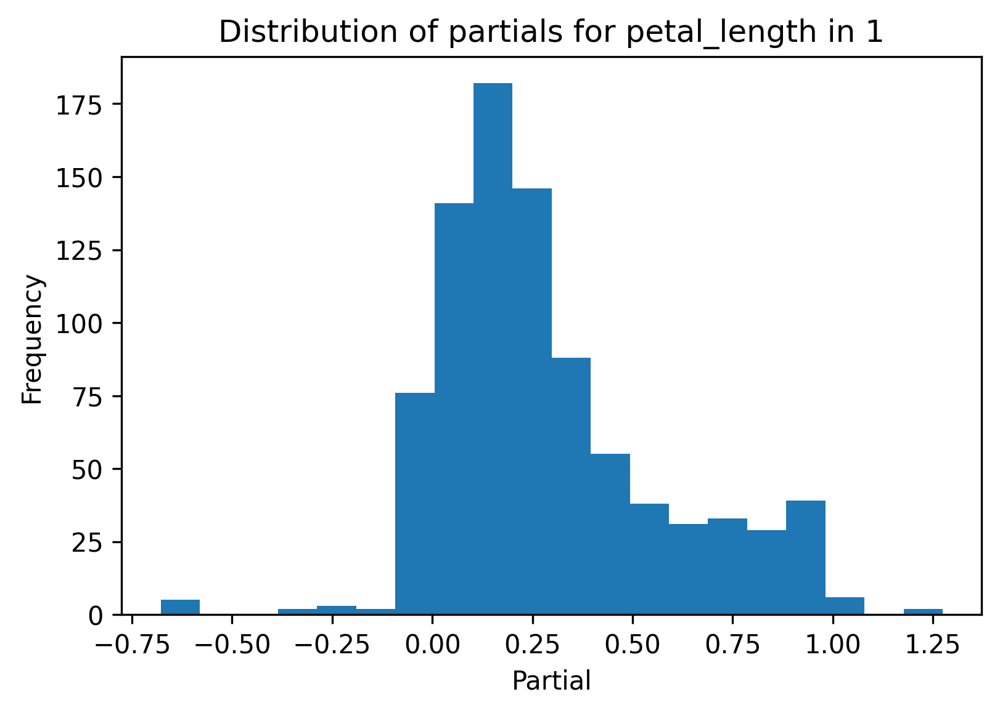

In [17]:
# Here is a summary of the most useful methods for describing the behavior of factors:

factor = forest.factors[1]


# ==============================
# ==============================


factor.sample_scores()
# This method returns factor sample scores for each sample in your dataset. 
# This is where the factor "applies", and represents the frequency with which each sample is 
# encountered in the nodes making up the factor. 
#
# The corresponding plotting method is:

# factor.plot_sample_counts()

# ==============================
# ==============================

factor.sister_scores()
# This method returns a factor sister score for each sample in your dataset. 
# This is similar to the sample score, but it tells you if this factor has a well defined sister
# or if it's just being split off from the overall population in general. Samples with a positive score
# are encountered frequently in this factor, and samples with a negative score are encountered frequently
# in the sisters of this factor.
# 
# The corresponding plotting method is:

# factor.plot_sister_scores()

# ==============================
# ==============================

ffam = factor.feature_conditional_gains(
    features = None
    # If you wish to save time, you can specify only particular features be returned. 
)
# Unnormalized difference in means relative to the parent. This is the "simple" prediction that nodes in 
# this factor make. If on average height in the US is 68 inches, then the factor corresponding to male sex will
# have conditional gain of 2 (+2 inches on average) and the sister factor of the male factor (the female factor)
# will have a conditional gain of -2 (-2 inches on average)

# These values are NOT normalized for children.

ffp = factor.feature_partials(
    features = None
    # If you wish to save time, you can specify only particular features be returned. 
)
# This provides you with feature partials for the factor. This is the percentage of the total variance in 
# a given feature explained by this factor. The percentage is signed, and the sign represents if the feature
# is positively or negatively regressed by this factor. (Eg, -.75 means that this factor explains 75% of all 
# variance for a feature, and the value of the feature is lower in this factor than overall.)

factor.nodes
# This is a property not a method, but gives you access to all nodes that a factor is made up of. 
# This is useful if you want to manually examine various properties of said nodes. 

# A typical use case might be to ask what the distribution of the partials in the factor is for each feature
# (eg are there a few nodes making really good predictions or many nodes making ok predictions?)

all_partials = forest.partial_matrix(factor.nodes)

plt.figure()
plt.title(f"Distribution of partials for {forest.output_features[0]} in {factor.name()}")
plt.hist(all_partials[:,0],bins=20)
plt.xlabel("Partial")
plt.ylabel("Frequency")
plt.show()

In [27]:
# Here is a summary of the most useful methods for working with nodes directly:

nodes = forest.nodes(
    
    # By default returns all nodes in the forest. The order is consistent every time if filtering is not applied.

    # For convenience you can also specify these filters: 
    root = True,
    # Include roots in the list of nodes returned? Certain values are a bit strange for roots since 
    # they have no parents. 
    
    depth = None,
    # Return nodes no deeper than this argument.     
)

leaves = forest.leaves(
    # Returns all the leaves in the forest. Leaves are nodes with no children.
    depth = None,
    # If you specify an integer value n here, this method will return leaves OR the nodes at depth n, whichever 
    # is shallower.

)



partials = forest.partial_matrix(nodes) 
# This method takes a list of nodes as an argument and returns a matrix of nodes x features where each element i,j
# is the partial gain for feature j in node i. 

conditionals = forest.conditional_gain_matrix(nodes)
# This method takes a list of nodes as an argument and returns a matrix of nodes x features where each element i,j
# is the conditional gain for feature j in node i. 
# Otherwise known as the Node Gain Encoding


Node 7000


AttributeError: 'Forest' object has no attribute 'conditional_gain_matrix'

In [28]:
node_sample_encoding.shape

(3470, 150)